** **
# **snRNAseq bioinformatics: Pre-processing, quality control and cell-type annotation in _Xenopus tropicalis_ mid-gastrula**

- https://scanpy.readthedocs.io/en/stable/index.html (documentation for single cell analysis in Python)
- Stage 12.0 single nucleus RNAseq data (Parse technology) with Maternal Foxi2 knockdown, unpublished

 






** **
# __Overview__

Section 1) Preprocessing, quality control and doublet detection

Section 2) Linear & non-linear dimension reduction techniques

Section 3) Surveying marker gene expression & doublet validation

Section 4) Clustering algorithms and gene expression based annotation

Section 5) Differential gene expression analysis

Section 6) Final cell-type annotation rationale considering on differential expression and literature precedence


** **

# __Section 1: Preprocessing & Quality Control__

 __Topics__
- Loading data and background software
- Filtering genes/cell
- Filtering cells with aberrant mitochondrial and ribosomal gene expression
- Doublet filtering
- Data normalization
- Optional batch-effect correction examples (commented)
- Calling highly variable genes
- Optional regression example (commented)

** **
 

__Part 1: Loading background software and data__

In [1]:
#Load background software
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
#import mnnpy
import scrublet as scr
import seaborn as sns

In [2]:
#Set scanpy settings for visualizations
sc.settings.verbosity = 2 #Scanpy verbosity reporting
sc.settings.set_figure_params(dpi=50) #Figure pixel resolution settings

# Suppress verbose package deprecation warnings during plotting

import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

__Project-relative paths and output directories__


In [3]:
# --- Stage- and condition-specific project path setup ---
from pathlib import Path
import sys

STAGE = "Stage12.0"
CONDITION = "MO"
DATASET_SLUG = "Stage12_0-MO"

STAGE_FOLDER_NAMES = {
    "Stage10": "Stage10",
    "Stage11.25": "Stage11_25",
    "Stage12": "Stage12",
    "Stage12.0": "Stage12_0",
    "Stage12.5": "Stage12_5",
    "Stage13": "Stage13",
}

CONDITION_SPECIFIC_STAGES = {"Stage11.25", "Stage12.0"}
VALID_CONDITIONS = {"WT", "MO"}

if STAGE not in STAGE_FOLDER_NAMES:
    raise ValueError(
        f"Invalid STAGE: {STAGE}. Choose from: {list(STAGE_FOLDER_NAMES)}"
    )

STAGE_FOLDER = STAGE_FOLDER_NAMES[STAGE]

if STAGE in CONDITION_SPECIFIC_STAGES:
    if CONDITION is None:
        raise ValueError(f"{STAGE} requires CONDITION='WT' or CONDITION='MO'.")
    CONDITION = CONDITION.upper()
    if CONDITION not in VALID_CONDITIONS:
        raise ValueError(f"Invalid CONDITION: {CONDITION}")
else:
    CONDITION = None


def find_project_root(start=None):
    """Locate the repository root using project-specific markers.

    A generic README.md alone is not sufficient. Requiring the scripts,
    notebooks, data, and results entries prevents a working subdirectory
    from being mistaken for the repository root.
    """
    start = Path.cwd().resolve() if start is None else Path(start).resolve()

    required_markers = (
        Path("README.md"),
        Path("notebooks"),
        Path("scripts") / "output_utils.py",
        Path("data"),
        Path("results"),
    )

    for candidate in (start, *start.parents):
        if all((candidate / marker).exists() for marker in required_markers):
            return candidate

    checked = "\n".join(str(path) for path in (start, *start.parents))
    raise FileNotFoundError(
        "Could not locate the gastrula snRNA-seq repository root.\n"
        "The root must contain README.md, notebooks/, scripts/output_utils.py, "
        "data/, and results/.\n\n"
        f"Directories checked:\n{checked}"
    )


PROJECT_DIR = find_project_root()

# Safety guard: outputs and data must never be rooted inside notebooks/.
if PROJECT_DIR.name.lower() == "notebooks":
    raise RuntimeError(
        "Path configuration error: PROJECT_DIR resolved to notebooks/. "
        "Use the repository root instead."
    )

if str(PROJECT_DIR) not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

DATA_DIR = PROJECT_DIR / "data"
RAW_DATA_DIR = DATA_DIR / "raw"
METADATA_DIR = DATA_DIR / "metadata"

STAGE_RAW_DATA_DIR = RAW_DATA_DIR / STAGE_FOLDER
STAGE_METADATA_DIR = METADATA_DIR / STAGE_FOLDER

RESULTS_DIR = PROJECT_DIR / "results"
STAGE_RESULTS_BASE_DIR = RESULTS_DIR / STAGE_FOLDER

if CONDITION is not None:
    STAGE_RESULTS_DIR = STAGE_RESULTS_BASE_DIR / CONDITION
else:
    STAGE_RESULTS_DIR = STAGE_RESULTS_BASE_DIR

QC_DIR = STAGE_RESULTS_DIR / "qc"
FIGURES_DIR = STAGE_RESULTS_DIR / "figures"
PROCESSED_DATA_DIR = STAGE_RESULTS_DIR / "processed_data"
DEG_DIR = STAGE_RESULTS_DIR / "differential_expression"
VALIDATION_DIR = STAGE_RESULTS_DIR / "validation"
TABLES_DIR = STAGE_RESULTS_DIR / "tables"


# Section 1 preprocessing/QC figures are stored directly in QC_DIR.
SECTION_FIGURE_DIRS = {
    "Section1": QC_DIR,
    "Section2": FIGURES_DIR / "Section2-DimensionReduction",
    "Section3": FIGURES_DIR / "Section3-MarkerGeneExpression",
    "Section4": FIGURES_DIR / "Section4-ClusteringAnnotation",
    "Section5": FIGURES_DIR / "Section5-DifferentialExpression",
    "Section6": FIGURES_DIR / "Section6-FinalAnnotation",
}

folders_to_create = [
    RAW_DATA_DIR,
    METADATA_DIR,
    STAGE_RAW_DATA_DIR,
    STAGE_METADATA_DIR,
    RESULTS_DIR,
    STAGE_RESULTS_BASE_DIR,
    STAGE_RESULTS_DIR,
    QC_DIR,
    FIGURES_DIR,
    PROCESSED_DATA_DIR,
    DEG_DIR,
    VALIDATION_DIR,
    TABLES_DIR,
    *SECTION_FIGURE_DIRS.values(),
]

for folder in folders_to_create:
    folder.mkdir(parents=True, exist_ok=True)

SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section1"]
sc.settings.figdir = str(SECTION_FIGURES_DIR)

legacy_nested_dirs = [
    PROJECT_DIR / "notebooks" / "data",
    PROJECT_DIR / "notebooks" / "results",
]
for legacy_dir in legacy_nested_dirs:
    if legacy_dir.exists():
        print(
            "WARNING: legacy nested directory detected:", legacy_dir,
            "\nMove its contents to the matching top-level data/ or results/ folder, "
            "then remove the nested directory."
        )

print("Notebook working directory:", Path.cwd().resolve())
print("Project directory:", PROJECT_DIR)
print("Dataset:", DATASET_SLUG)
print("Input directory:", STAGE_RAW_DATA_DIR)
print("Results directory:", STAGE_RESULTS_DIR)
print("Current figure directory:", SECTION_FIGURES_DIR)


Notebook working directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\notebooks
Project directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle
Dataset: Stage12_0-MO
Input directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\data\raw\Stage12_0
Results directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO
Current figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc


__Upload our Stage 12.0 MO expression matrix and meta data__

In [4]:
# Load the stage-specific AnnData file from a project-relative path.
INPUT_H5AD_FILENAME = "PARSE-MOSt12-Unfiltered_FromSeurat.h5ad"
INPUT_H5AD = STAGE_RAW_DATA_DIR / INPUT_H5AD_FILENAME

if not INPUT_H5AD.exists():
    legacy_nested_input = (
        PROJECT_DIR
        / "notebooks"
        / "data"
        / "raw"
        / STAGE_FOLDER
        / INPUT_H5AD_FILENAME
    )

    if legacy_nested_input.exists():
        raise FileNotFoundError(
            "The input file was found in the old incorrect nested location:\n"
            f"{legacy_nested_input}\n\n"
            "Move it to the repository-level input directory:\n"
            f"{INPUT_H5AD}"
        )

    raise FileNotFoundError(
        f"Input file not found:\n{INPUT_H5AD}\n\n"
        f"Place the input file in:\n{STAGE_RAW_DATA_DIR}"
    )

adata = sc.read_h5ad(INPUT_H5AD)

print("Dataset:", DATASET_SLUG)
print("Loaded file:", INPUT_H5AD)
print("AnnData shape:", adata.shape)

adata


Dataset: Stage12_0-MO
Loaded file: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\data\raw\Stage12_0\PARSE-MOSt12-Unfiltered_FromSeurat.h5ad
AnnData shape: (110590, 21821)


AnnData object with n_obs × n_vars = 110590 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind'
    var: 'features'

In [5]:
#Visualize features our annotated dataframe
adata.obs

              orig.ident  nCount_RNA  nFeature_RNA      bc_wells sample  \
07_01_01__s1           0       305.0           277  07_01_01__s1     MO   
07_01_02__s1           0       121.0           110  07_01_02__s1     MO   
07_01_03__s1           0      1103.0           859  07_01_03__s1     MO   
07_01_04__s1           0       204.0           188  07_01_04__s1     MO   
07_01_05__s1           0       399.0           365  07_01_05__s1     MO   
...                  ...         ...           ...           ...    ...   
12_96_91__s2           5       461.0           418  12_96_91__s2     MO   
12_96_92__s2           5       755.0           617  12_96_92__s2     MO   
12_96_93__s2           5      3889.0          1786  12_96_93__s2     MO   
12_96_94__s2           5       313.0           297  12_96_94__s2     MO   
12_96_95__s2           5       572.0           491  12_96_95__s2     MO   

              species  gene_count  tscp_count  mread_count bc1_well bc2_well  \
07_01_01__s1  xenop

__Part 1: Filtering by cells/gene and genes/cell__

In [6]:
# Filter background barcodes
sc.pp.filter_cells(adata, min_genes=1000) # Remove cells expressing fewer than 1,000 genes

#I personally don't remove lowly expressed genes until after I see clustering.
#There may be a cluster with 50 or fewer cells which I don't want to arbitrarily exclude.

#sc.pp.filter_genes(adata, min_cells=50) #Remove genes who are expressed in 50 or fewer cells

print(adata.n_obs, adata.n_vars) #How many cells and genes pass QC

filtered out 96623 cells that have less than 1000 genes expressed
13967 21821


In [7]:
adata

AnnData object with n_obs × n_vars = 13967 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes'
    var: 'features'

** **
__Part 2: Investigating and filtering mitochondrial and ribosomal reads from cells__

Typically in single Cell RNAseq:
- High percentages (>20%) of Mitochondrial reads indicate stressed and dying cells
- Low percentages (<3.5%) of Ribosomal reads indicate transcriptionally silent cells (for typical scRNAseq)

__However, in single nuclei RNAseq we do not expect to recover appreciable amount of ribosomal or mitochondrial reads.__




__Denote Ribosomal and Mitochondrial genes within the dataset and calculate their abundance metrics__

In [8]:
#adata.var_names_make_unique()

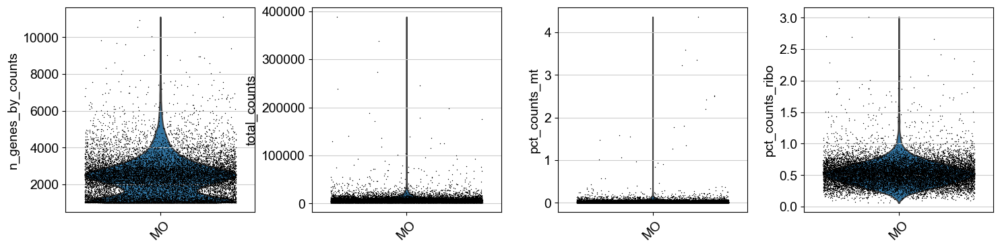

In [9]:
# Specifically label mitochondrial genes within the matrix
adata.var['mt'] = adata.var_names.str.startswith(('COX', 'ND', "CYTB", "ATP"))


# Specifically label ribosomal genes within the matrix
adata.var['ribo'] = adata.var_names.str.startswith(("rps","rpl"))


#Calculate "mt" and "ribo" percentage of count metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo'], percent_top=None, log1p=True, inplace=True)


#Plot our "mt" and "ribo" percent metrics
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = "sample", rotation= 45, save="_S01_01_violin_sample_n_genes_by_counts_total_counts_pct_counts_mt_pct_counts_ribo.png")

In [10]:
adata.var

                  features     mt   ribo  n_cells_by_counts  mean_counts  \
nsfl1c              nsfl1c  False  False               2571     0.245149   
clul1                clul1  False  False                  7     0.000501   
vwc2l                vwc2l  False  False                 12     0.000859   
slc47a1            slc47a1  False  False                 17     0.001360   
ikbkg                ikbkg  False  False                990     0.080690   
...                    ...    ...    ...                ...          ...   
LOC105945311  LOC105945311  False  False                  0     0.000000   
LOC100493003  LOC100493003  False  False                  0     0.000000   
LOC116406866  LOC116406866  False  False                 30     0.002721   
LOC105945488  LOC105945488  False  False                485     0.041312   
crygdl.43        crygdl.43  False  False                  0     0.000000   

              log1p_mean_counts  pct_dropout_by_counts  total_counts  \
nsfl1c         

In [11]:
#adata.var.index.name = "gene"
#print(adata.var.index.name)

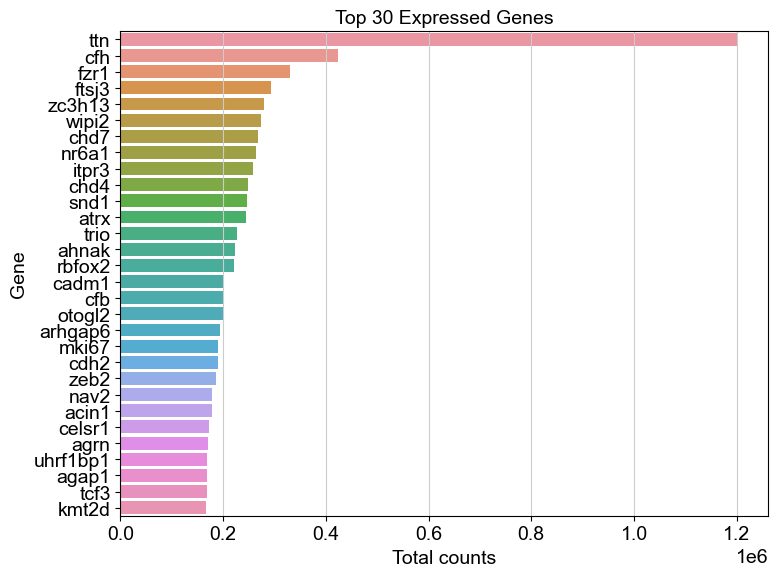

In [12]:
# Make sure gene-level total_counts exists
# calculate_qc_metrics should add adata.var["total_counts"]
top_genes = (
    adata.var[["total_counts"]]
    .sort_values("total_counts", ascending=False)
    .head(30)
    .reset_index()
    .rename(columns={"index": "gene"})
)

plt.figure(figsize=(8, 6))
sns.barplot(
    data=top_genes,
    y="gene",
    x="total_counts"
)

plt.xlabel("Total counts")
plt.ylabel("Gene")
plt.title("Top 30 Expressed Genes")
plt.tight_layout()
plt.savefig(SECTION_FIGURES_DIR / "S01_02_top_30_expressed_genes.png", dpi=300, bbox_inches="tight")
plt.show()

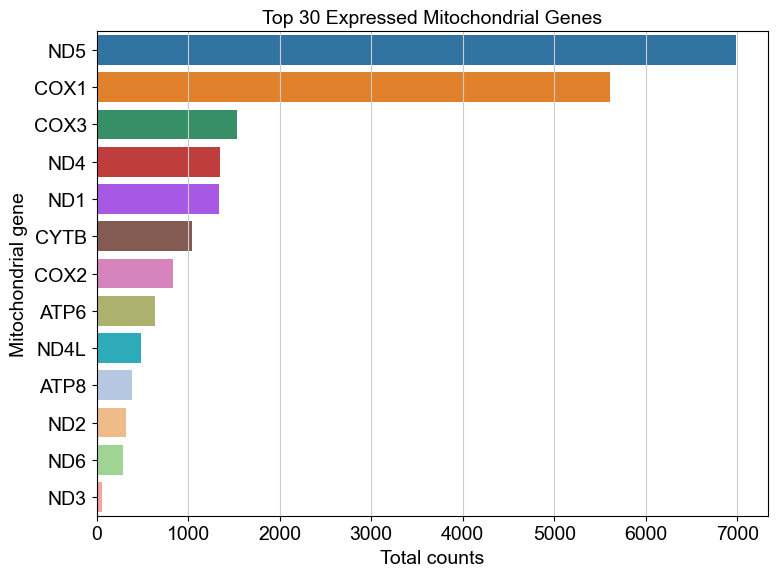

In [13]:
top_mt_genes = (
    adata.var.loc[adata.var["mt"], ["total_counts"]]
    .sort_values("total_counts", ascending=False)
    .head(30)
    .reset_index()
    .rename(columns={"index": "gene"})
)

plt.figure(figsize=(8, 6))
sns.barplot(
    data=top_mt_genes,
    y="gene",
    x="total_counts"
)

plt.xlabel("Total counts")
plt.ylabel("Mitochondrial gene")
plt.title("Top 30 Expressed Mitochondrial Genes")
plt.tight_layout()
plt.savefig(SECTION_FIGURES_DIR / "S01_03_top_30_expressed_mitochondrial_genes.png", dpi=300, bbox_inches="tight")
plt.show()

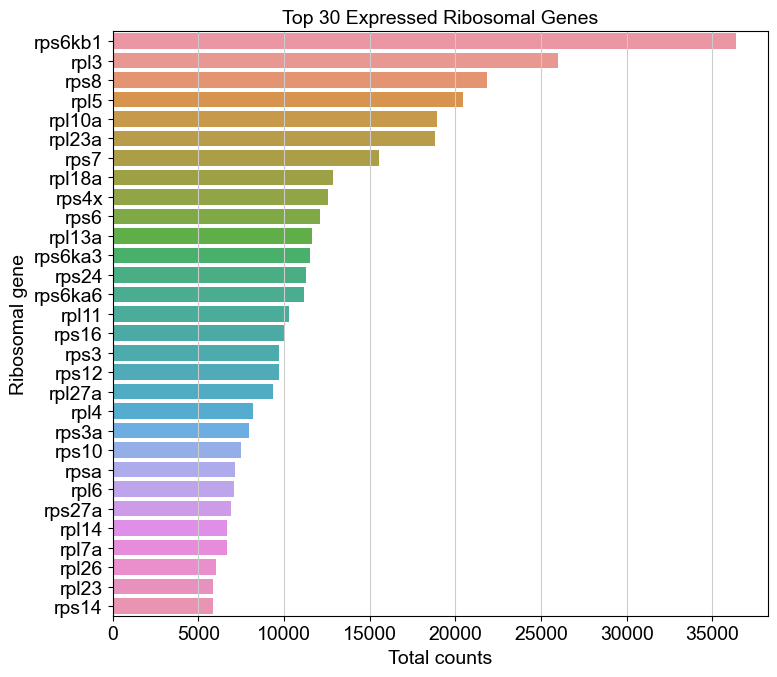

In [14]:
#Optional but recommended: make ribosomal labeling case-insensitive
adata.var["ribo"] = adata.var_names.str.lower().str.startswith(("rps", "rpl"))

# Make sure total_counts exists in adata.var
# This should already exist after sc.pp.calculate_qc_metrics()
if "total_counts" not in adata.var.columns:
    sc.pp.calculate_qc_metrics(
        adata,
        qc_vars=["mt", "ribo"],
        percent_top=None,
        log1p=True,
        inplace=True
    )

# Get top ribosomal genes
top_ribo_genes = (
    adata.var.loc[adata.var["ribo"], ["total_counts"]]
    .sort_values("total_counts", ascending=False)
    .head(30)
    .reset_index()
    .rename(columns={"index": "gene"})
)

# Plot
plt.figure(figsize=(8, 7))
sns.barplot(
    data=top_ribo_genes,
    y="gene",
    x="total_counts"
)

plt.xlabel("Total counts")
plt.ylabel("Ribosomal gene")
plt.title("Top 30 Expressed Ribosomal Genes")
plt.tight_layout()
plt.savefig(SECTION_FIGURES_DIR / "S01_04_top_30_expressed_ribosomal_genes.png", dpi=300, bbox_inches="tight")
plt.show()

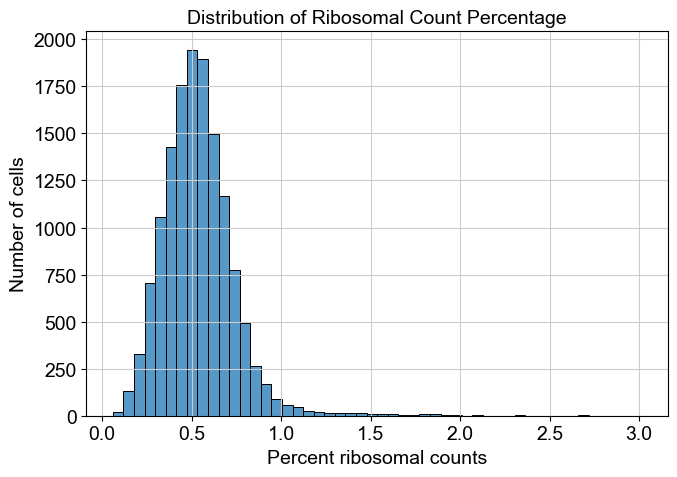

In [15]:
plt.figure(figsize=(7, 5))
sns.histplot(
    adata.obs["pct_counts_ribo"],
    bins=50
)

plt.xlabel("Percent ribosomal counts")
plt.ylabel("Number of cells")
plt.title("Distribution of Ribosomal Count Percentage")
plt.tight_layout()
plt.savefig(SECTION_FIGURES_DIR / "S01_05_ribosomal_percentage_distribution.png", dpi=300, bbox_inches="tight")
plt.show()

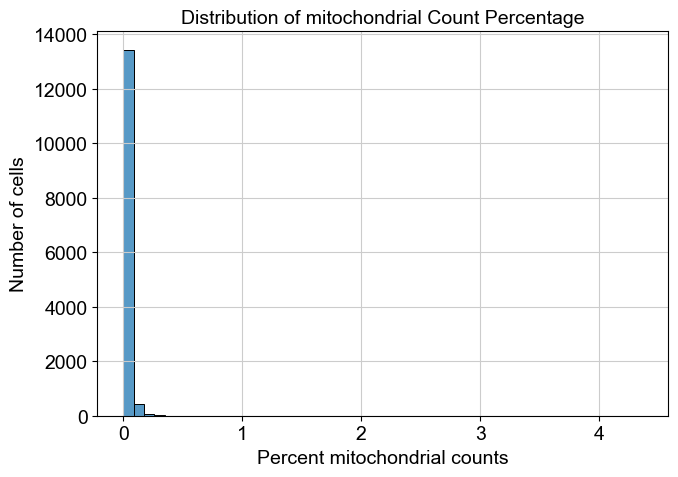

In [16]:
plt.figure(figsize=(7, 5))
sns.histplot(
    adata.obs["pct_counts_mt"],
    bins=50
)

plt.xlabel("Percent mitochondrial counts")
plt.ylabel("Number of cells")
plt.title("Distribution of mitochondrial Count Percentage")
plt.tight_layout()
plt.savefig(SECTION_FIGURES_DIR / "S01_06_mitochondrial_percentage_distribution.png", dpi=300, bbox_inches="tight")
plt.show()

__Remove cells with aberrant mitochondrial and ribosomal count proportions__

In [17]:
#Remove cells with >20% mitochondrial read count percentage
adata = adata[adata.obs['pct_counts_mt'] < 20, :]

# Remove cells with >3.5% ribosomal read count percentage
adata = adata[adata.obs['pct_counts_ribo'] < 3.5, :]

print("Remaining cells %d"%adata.n_obs)

Remaining cells 13967


** **
__Part 3: Predicting and filtering Doublets__

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.22
Detected doublet rate = 9.8%
Estimated detectable doublet fraction = 46.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 21.0%
Elapsed time: 29.1 seconds


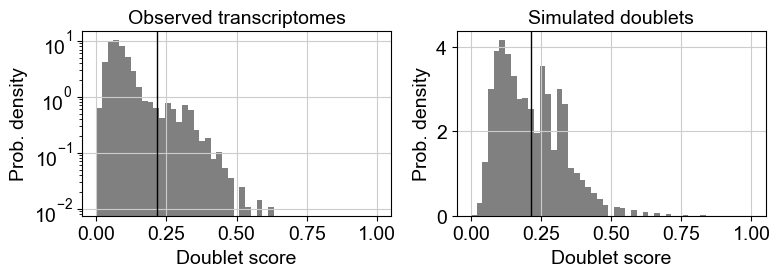

Saved QC figure: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc\S01_07_scrublet_doublet_score_histogram.png
Predicted doublets: 1369


In [18]:
adata.raw = adata
scrub = scr.Scrublet(adata.raw.X)
adata.obs["doublet_scores"], adata.obs["predicted_doublets"] = scrub.scrub_doublets()

# Scrublet creates its own Matplotlib figure, so save it explicitly to qc/.
scrub.plot_histogram()
scrublet_figure = plt.gcf()
scrublet_histogram_path = QC_DIR / "S01_07_scrublet_doublet_score_histogram.png"
scrublet_figure.savefig(scrublet_histogram_path, dpi=300, bbox_inches="tight")
plt.show()
plt.close(scrublet_figure)

print("Saved QC figure:", scrublet_histogram_path)
print("Predicted doublets:", int(adata.obs["predicted_doublets"].sum()))


In [19]:
# add in column with singlet/doublet instead of True/False
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

__Visualize the estimated doublet proportion of the dataset__

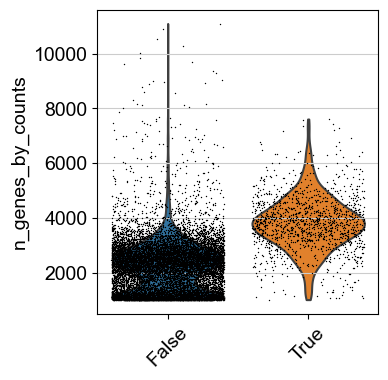

In [20]:
#Plot doublets vs singlets to reveal relative doublet abundance
sc.pl.violin(adata, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45, save="_S01_08_violin_doublet_info_n_genes_by_counts.png")

__So the question is... to remove, or not to remove doublets from the dataset?__

__In my opinion, before you remove your doublets it's best to double check the doublet prediction by visualizing known marker gene expression!__

Rationalization: If a cell expresses multiple markers from distinct tissue types it's probably a doublet.

** **
__Part 4: Additional pre-processing, calling Highly Variable Genes and correcting for batch effects__

__Normalization__

In [21]:
# normalize to depth of 10,000 counts/cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# log-transform
sc.pp.log1p(adata)


# store normalized counts in the raw slot, 
# we will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata

adata

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 13967 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'n_counts'
    var: 'features', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors', 'doublet_info_colors', 'log1p'

__Distinguish Highly Variable Genes__

extracting highly variable genes
    finished (0:00:03)
Highly variable genes: 7690


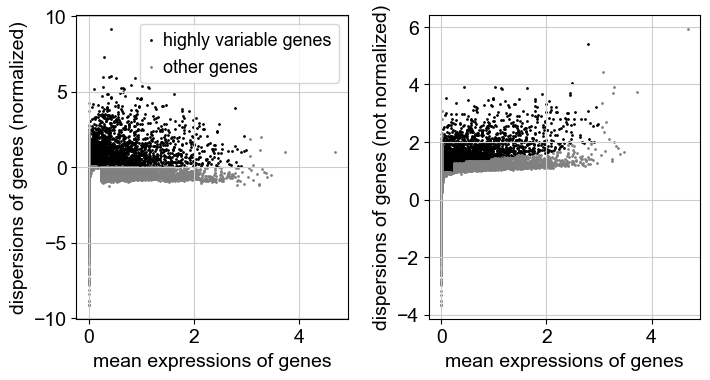

In [22]:
# compute variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.05)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(adata, save="_S01_09_highly_variable_genes.png")

# subset for variable genes in the dataset
adata = adata[:, adata.var['highly_variable']]

__Conduct library Batch Corrections using MNN software (FYI)__

We only have a single sequencing library for Stage 10.5, however if you did have multiple sequencing libraries then you could perform batch corrections.

In the example code below, the batch key called "lib_name" is a column of adata2.obs where the row identifiers were "Library_17", "Library_18", "Library_19", etc

For you to run this code using your data, you need to change the column "lib_name" to your library column name, and the "Library_17"-"Library_22" identifiers to your row identifiers.

In [23]:
#adata2 = adata.raw.to_adata() 
#var_genes_all = adata.var.highly_variable
#print("Highly variable genes: %d"%sum(var_genes_all))

#Detect HVG in each different library via batch_key parameter
#sc.pp.highly_variable_genes(adata2, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'lib_name')

#print("Highly variable genes intersection: %d"%sum(adata2.var.highly_variable_intersection))
#print("Number of batches where gene is variable:")
#print(adata2.var.highly_variable_nbatches.value_counts())
#var_genes_batch = adata2.var.highly_variable_nbatches > 0
#Compare overlapping variably expressed genes across each of the libraries
#Here you rename the HVG into another variable name, take note if you want to make figures from them
#print("Any batch var genes: %d"%sum(var_genes_batch))
#print("All data var genes: %d"%sum(var_genes_all))
#print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
#print("Variable genes in all batches: %d"%sum(adata2.var.highly_variable_nbatches == 6))
#print("Overlap batch intersection and all: %d"%sum(var_genes_all & adata2.var.highly_variable_intersection))
#Select and subset genes which remain variable across at least 2/3 libraries
#var_select = adata2.var.highly_variable_nbatches > 2
#var_genes = var_select.index[var_select]
#len(var_genes)
#Create an individual AnnData object from each library
# split per batch into new objects.
#batches = adata.obs['lib_name'].cat.categories.tolist()
#alldata = {}
#for batch in batches:
    #alldata[batch] = adata2[adata2.obs['lib_name'] == batch,]
#alldata

#Finally, perform batch correction via mnnpy software
#cdata = sc.external.pp.mnn_correct(alldata['Library_17'], alldata['Library_18'], alldata['Library_19'],
                                  #alldata['Library_20'], alldata['Library_21'], alldata['Library_22'],
                                  #svd_dim = 50, batch_key = 'lib_name', save_raw = True, var_subset = var_genes)

#Corr_data is the new combined AnnData object's subsetted Variable Genes
#corr_data = cdata[0][:,var_genes]
#corr_data.X.shape


__Utilize regression to eliminate impact of mitochondrial counts__

I'm not implementing it here because we have so few mitochondrial counts, however FYI

In [24]:
# Utilize linear regression to decrease effect of differential or unwanted variables
#sc.pp.regress_out(adata, ['pct_counts_mt'])


** **
** **

# __Section 2: Linear and non-linear dimension reduction analysis__

 __Topics__
- Principal Component Analysis (PCA)
- t-Stochastic Neighbor Embedding (tSNE)
- Uniform Manifold Approximation Projection (UMAP)

** **
 

In [25]:
# Route all Scanpy and Matplotlib figures in Section 2 here.
SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section2"]
SECTION_FIGURES_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = str(SECTION_FIGURES_DIR)

print("Current section figure directory:", SECTION_FIGURES_DIR)


Current section figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\figures\Section2-DimensionReduction


__Part 1: Linear Dimension Reduction: Principal Component Analysis (PCA)__

__Calculate PCA__

In [26]:
# Perform PCA on our pre-processed data

sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:24)


__Visualize top PCA components__

- During PCA, components are ranked in descending order of variance explained.
- Here, covariance is derived from comparing a cell's differential expression compared to other cells across the dataset.
- Generally, genes that are the most highly expressed and differentially expressed will contribute the most variance.

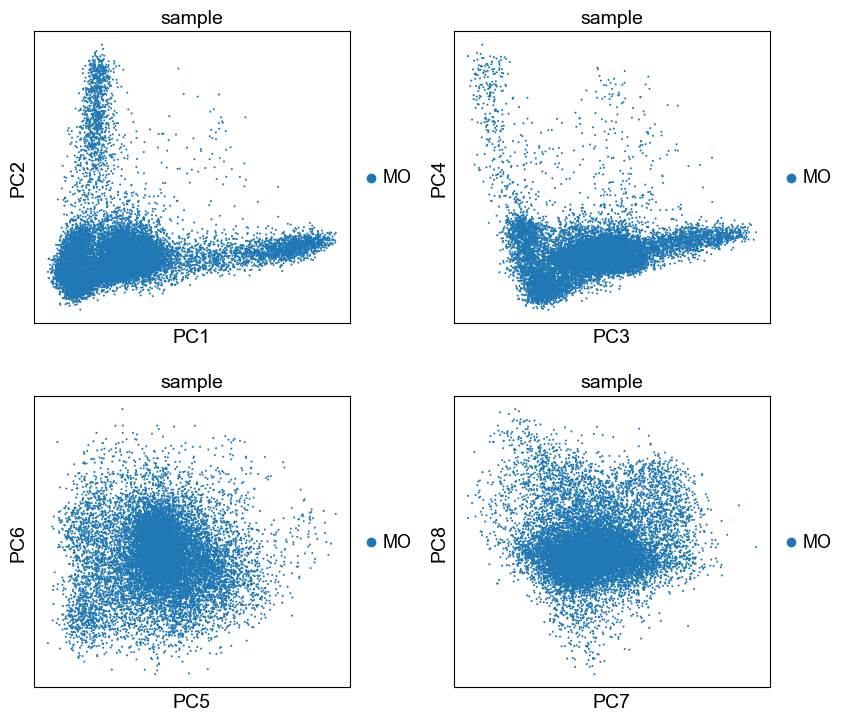

In [27]:
# Investigate specific principal components

sc.pl.pca(adata, color='sample', components = ['1,2','3,4','5,6','7,8'], ncols=2, save="_S02_01_pca_sample.png")
#components comparisons can be changed to your liking

__Visualize the variance contributed by each Principal Component__

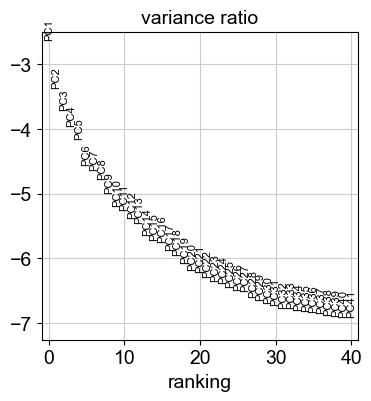

In [28]:
#Investigate the variance explained by each Principle Coordinate
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 40, save="_S02_02_pca_variance_ratio.png")

__Visualize the PCA loadings__

- Principle component loadings reveal the genes which contribute most to variance of each component

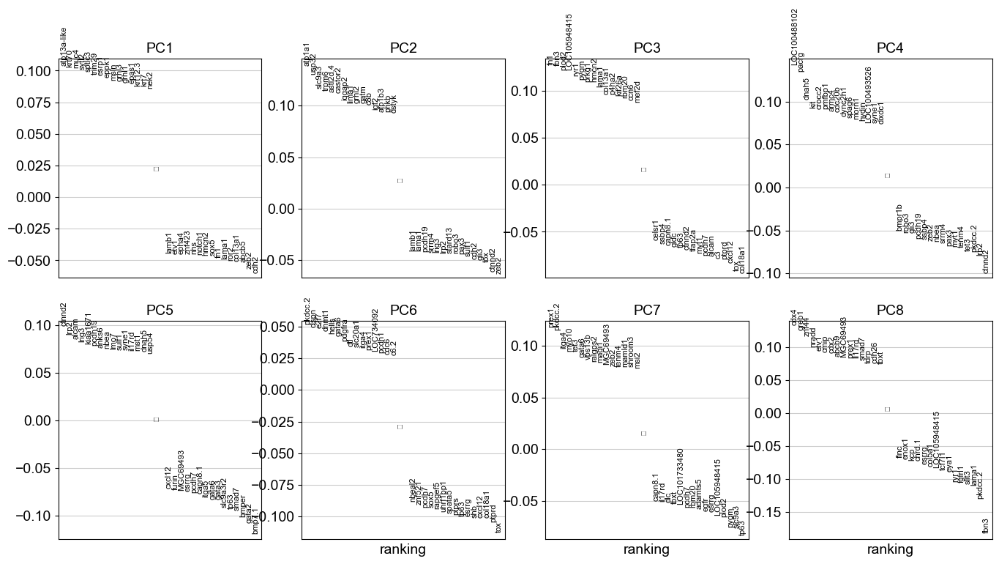

In [29]:
#Plot loadings
sc.pl.pca_loadings(adata, components=[1,2,3,4,5,6,7,8], save="_S02_03_pca_loadings.png")

** **
__Part 2: Non-linear Dimension Reduction: t-Stochastic Neighbor Embedding (tSNE)__

__Compute tSNE__

In [30]:
sc.tl.tsne(adata, n_pcs = 30)

#This can be run using different n_pcs which varies the number of principal components used in the analysis

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished (0:02:22)


__Visualize tSNE__

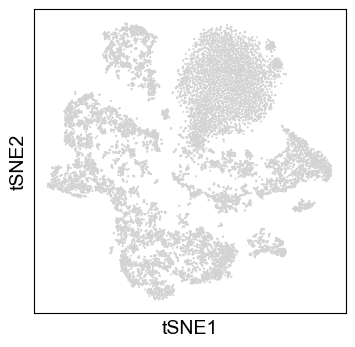

In [31]:
sc.pl.tsne(adata, save="_S02_04_tsne.png")

__Try varying the number of components used to educate tSNE, and see how it effects the embeddings__

In [32]:
#Change the n_pcs = (X) parameter and see the effect
sc.tl.tsne(adata, n_pcs = 99) #Here I have changed to 8 principal components

computing tSNE
    using 'X_pca' with n_pcs = 99
    using sklearn.manifold.TSNE
    finished (0:02:32)


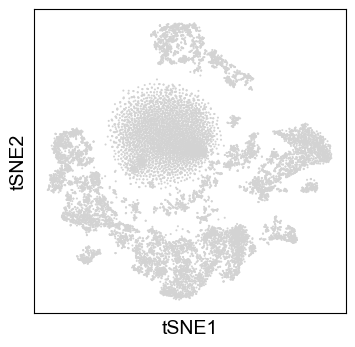

In [33]:
#Plot your varied components tSNE
sc.pl.tsne(adata, save="_S02_05_tsne.png")
#This can be run using different n_pcs which varies the number of principal components used in the analysis

** **
__Part 3: Non-linear Dimension Reduction: Uniform Manifold Approximation Projection (UMAP)__

__Calculate UMAP__

You can modulate your UMAP output by selecting different parameters of principal coordinate (n_pcs) and nearest neighbors (n_neighbors)

- Increasing n_pcs incorporates more components that explain less variance.
- Increasing n_neighbors causes each cell to consider additional neighbors when placing itself in the plot.

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished (0:00:54)
computing UMAP
    finished (0:00:13)


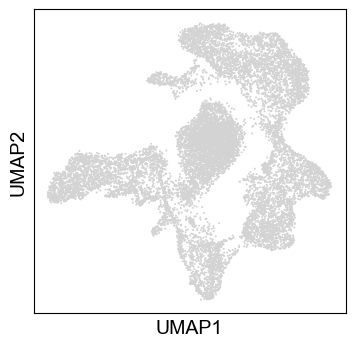

In [34]:
#Calculate a neighborhood graph based on principal components and some number of nearest neighbors to consider
sc.pp.neighbors(adata, n_pcs = 10, n_neighbors = 50)

#Compute machine learning using UMAP algorithm combined with our data set and our neighborhood graph calculated from the previous step
sc.tl.umap(adata, n_components=2)

#Plot the UMAP
sc.pl.umap(adata, save="_S02_06_umap.png")

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished (0:00:03)
computing UMAP
    finished (0:00:14)


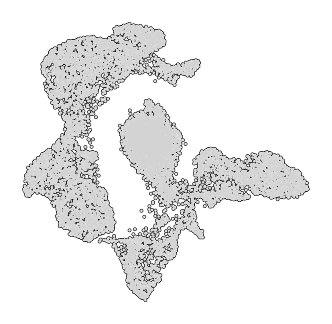

In [35]:
sc.pp.neighbors(adata, n_pcs = 20, n_neighbors = 50)
sc.tl.umap(adata, n_components=2)
sc.pl.umap(adata, frameon=False, size=10, add_outline=True, save="_S02_07_umap.png")

computing neighbors
    using 'X_pca' with n_pcs = 99
    finished (0:00:04)
computing UMAP
    finished (0:00:14)


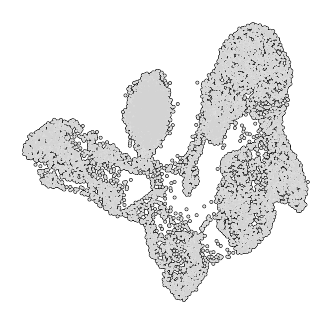

In [36]:
sc.pp.neighbors(adata, n_pcs = 99, n_neighbors = 50)
sc.tl.umap(adata, n_components=2)
sc.pl.umap(adata, frameon=False, size=10, add_outline=True, save="_S02_08_umap.png")

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished (0:00:08)
computing UMAP
    finished (0:00:15)


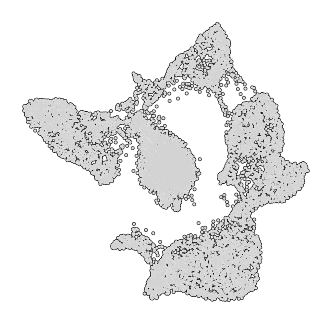

In [37]:
sc.pp.neighbors(adata, n_pcs = 25, n_neighbors = 75)
sc.tl.umap(adata, n_components=2)
sc.pl.umap(adata, frameon=False, size=10, add_outline=True, save="_S02_09_umap.png")

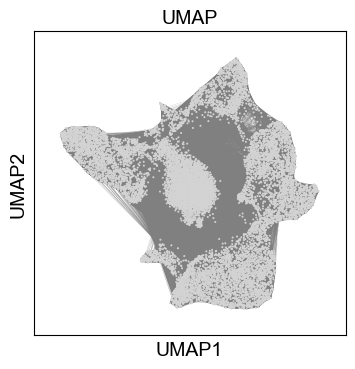

In [38]:
# we can also plot the umap with neighbor edges
sc.pl.umap(adata, title="UMAP", edges=True, save="_S02_10_umap.png")

** **

# __Section 3: Surveying marker gene expression & doublet validation__

 __Topics__
- Visualizing the localization of known germ layer differentiating marker genes
- Marker gene expression helps us validate doublet predictions

** **
 

In [39]:
# Route all Scanpy and Matplotlib figures in Section 3 here.
SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section3"]
SECTION_FIGURES_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = str(SECTION_FIGURES_DIR)

print("Current section figure directory:", SECTION_FIGURES_DIR)


Current section figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\figures\Section3-MarkerGeneExpression


__Part 1: Visualizing germ layer marker genes__

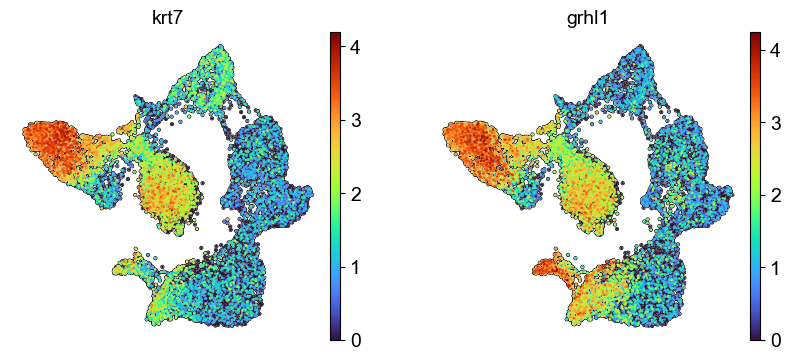

In [40]:
#Epidermal Markers Markers
gene_list=['krt7', 'grhl1']
sc.pl.umap(adata, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_01_umap_marker_panel.png")

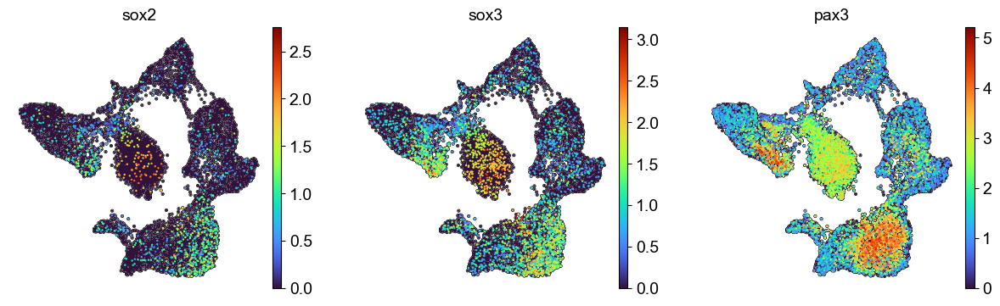

In [41]:
#Neuroectoderm Markers
gene_list=['sox2', 'sox3', 'pax3']
sc.pl.umap(adata, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_02_umap_marker_panel.png")

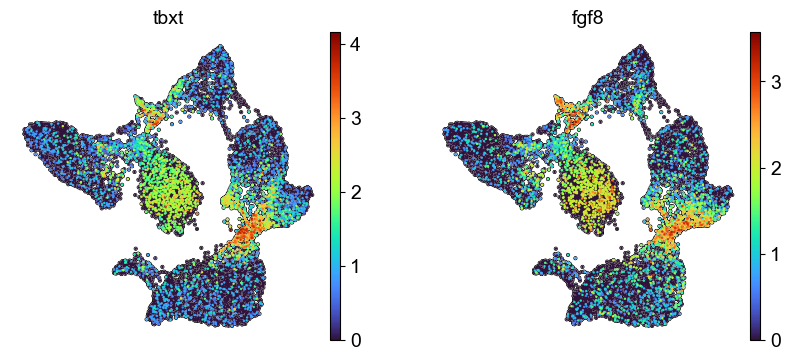

In [42]:
#Mesodermal Markers Markers
gene_list=['tbxt', 'fgf8']
sc.pl.umap(adata, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_03_umap_marker_panel.png")

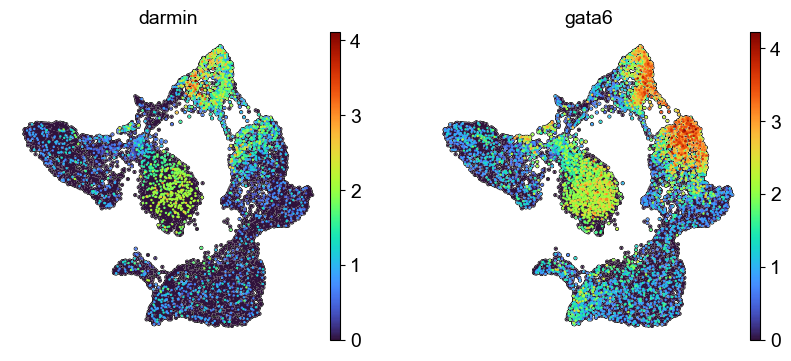

In [43]:
#Endodermal Markers Markers
gene_list=['darmin', 'gata6']
sc.pl.umap(adata, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_04_umap_marker_panel.png")

__Part 2: Validating doublet predictions__

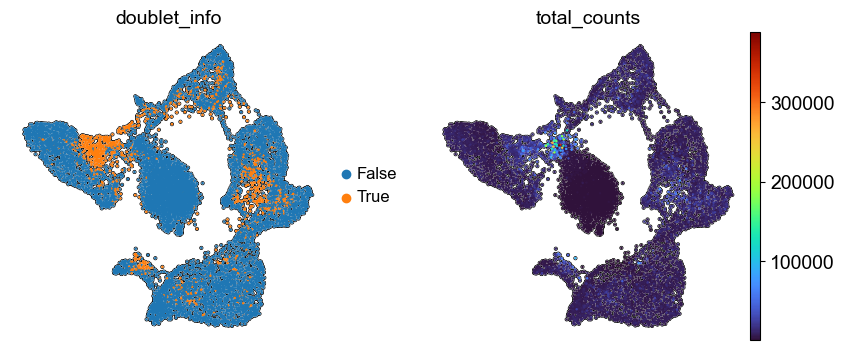

In [44]:
#Predicted Doublets
sc.pl.umap(adata, color=["doublet_info", 'total_counts'],  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_05_umap_doublet_info_total_counts.png")

__Removing predicted doublets__

In [45]:
# Remove predicted doublets and record before/after cell counts for QC reporting.
n_cells_before_doublet_filter = int(adata.n_obs)
n_predicted_doublets = int(
    adata.obs["doublet_info"].astype(str).eq("True").sum()
)

# Restore the normalized, log-transformed all-gene matrix stored in adata.raw.
adata = adata.raw.to_adata()

# Keep singlets only and materialize a copy to avoid AnnData view behavior.
adata = adata[adata.obs["doublet_info"].astype(str).eq("False"), :].copy()
n_cells_after_doublet_filter = int(adata.n_obs)

print("Cells before doublet filtering:", n_cells_before_doublet_filter)
print("Predicted doublets removed:", n_predicted_doublets)
print("Cells after doublet filtering:", n_cells_after_doublet_filter)
print("Post-doublet AnnData shape:", adata.shape)


Cells before doublet filtering: 13967
Predicted doublets removed: 1369
Cells after doublet filtering: 12598
Post-doublet AnnData shape: (12598, 21821)


__Post-doublet quality-control summaries__

The following plots summarize the detected reads per retained singlet after predicted doublets have been removed. These quality-control outputs are written directly to the stage-specific `qc/` directory rather than to the general Section 3 figure directory.


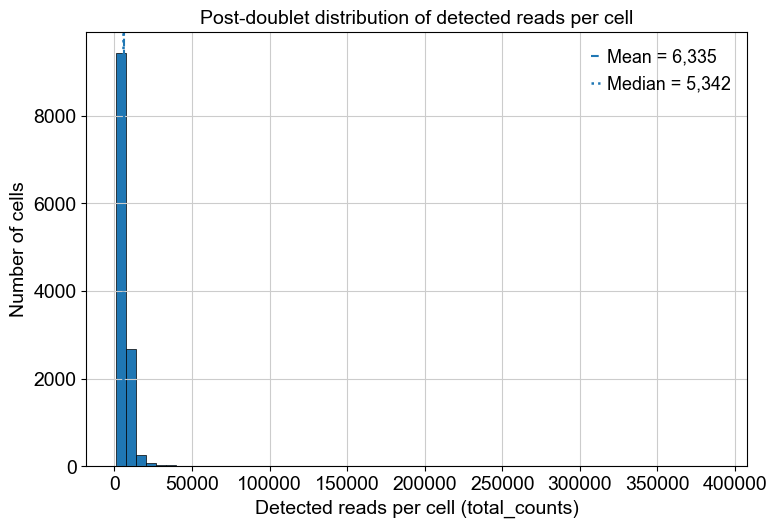

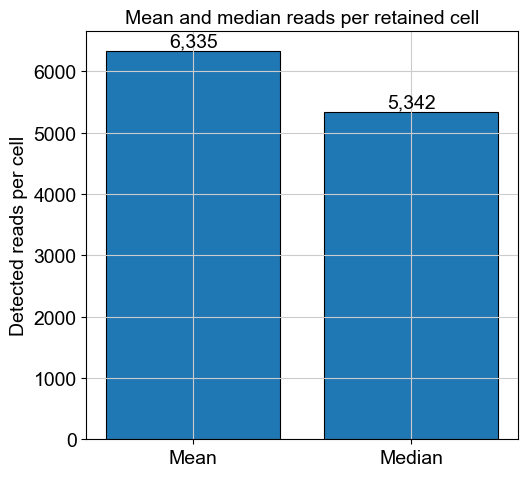

Saved QC figure: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc\post_doublet_reads_per_cell_distribution.png
Saved QC figure: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc\post_doublet_mean_median_reads_per_cell.png
Saved QC table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc\post_doublet_qc_summary.csv
Saved QC table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\qc\post_doublet_reads_per_cell_summary.csv


In [46]:
# Summarize detected reads per retained cell after doublet removal.
# `total_counts` was calculated from the original count matrix during QC and is
# retained in adata.obs after restoring adata.raw and subsetting singlets.
READS_PER_CELL_COL = "total_counts"

if READS_PER_CELL_COL not in adata.obs.columns:
    raise KeyError(
        f"{READS_PER_CELL_COL!r} is missing from adata.obs. "
        "Run sc.pp.calculate_qc_metrics before this cell."
    )

reads_per_cell = pd.to_numeric(
    adata.obs[READS_PER_CELL_COL],
    errors="coerce",
).dropna()

if reads_per_cell.empty:
    raise ValueError("No finite total_counts values were available for QC plotting.")

mean_reads_per_cell = float(reads_per_cell.mean())
median_reads_per_cell = float(reads_per_cell.median())

# Save a compact cell-retention and read-count summary table.
post_doublet_qc_summary = pd.DataFrame(
    {
        "metric": [
            "cells_before_doublet_filter",
            "predicted_doublets_removed",
            "cells_after_doublet_filter",
            "mean_reads_per_cell",
            "median_reads_per_cell",
        ],
        "value": [
            n_cells_before_doublet_filter,
            n_predicted_doublets,
            n_cells_after_doublet_filter,
            mean_reads_per_cell,
            median_reads_per_cell,
        ],
    }
)

post_doublet_qc_summary_path = QC_DIR / "post_doublet_qc_summary.csv"
post_doublet_qc_summary.to_csv(post_doublet_qc_summary_path, index=False)

# Save distributional statistics, including useful tail quantiles.
reads_per_cell_summary = (
    reads_per_cell.describe(
        percentiles=[0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
    )
    .rename_axis("statistic")
    .reset_index(name="reads_per_cell")
)

reads_per_cell_summary_path = QC_DIR / "post_doublet_reads_per_cell_summary.csv"
reads_per_cell_summary.to_csv(reads_per_cell_summary_path, index=False)

# Histogram: number of cells on the y-axis and detected reads/cell on the x-axis.
fig, ax = plt.subplots(figsize=(8, 5.5))
ax.hist(reads_per_cell, bins=60, edgecolor="black", linewidth=0.5)
ax.axvline(
    mean_reads_per_cell,
    linestyle="--",
    linewidth=1.5,
    label=f"Mean = {mean_reads_per_cell:,.0f}",
)
ax.axvline(
    median_reads_per_cell,
    linestyle=":",
    linewidth=1.8,
    label=f"Median = {median_reads_per_cell:,.0f}",
)
ax.set_xlabel("Detected reads per cell (total_counts)")
ax.set_ylabel("Number of cells")
ax.set_title("Post-doublet distribution of detected reads per cell")
ax.legend(frameon=False)
fig.tight_layout()

reads_distribution_path = QC_DIR / "post_doublet_reads_per_cell_distribution.png"
fig.savefig(reads_distribution_path, dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig)

# Bar graph comparing the mean and median detected reads per retained cell.
read_stat_table = pd.DataFrame(
    {
        "statistic": ["Mean", "Median"],
        "reads_per_cell": [mean_reads_per_cell, median_reads_per_cell],
    }
)

fig, ax = plt.subplots(figsize=(5.5, 5))
bars = ax.bar(
    read_stat_table["statistic"],
    read_stat_table["reads_per_cell"],
    edgecolor="black",
    linewidth=0.8,
)
ax.set_xlabel("")
ax.set_ylabel("Detected reads per cell")
ax.set_title("Mean and median reads per retained cell")

for bar, value in zip(bars, read_stat_table["reads_per_cell"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{value:,.0f}",
        ha="center",
        va="bottom",
    )

fig.tight_layout()
mean_median_path = QC_DIR / "post_doublet_mean_median_reads_per_cell.png"
fig.savefig(mean_median_path, dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig)

print("Saved QC figure:", reads_distribution_path)
print("Saved QC figure:", mean_median_path)
print("Saved QC table:", post_doublet_qc_summary_path)
print("Saved QC table:", reads_per_cell_summary_path)


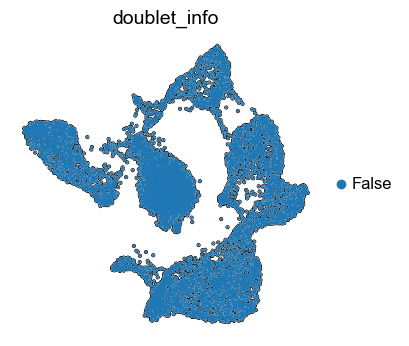

In [47]:
#Predicted Doublets
sc.pl.umap(adata, color="doublet_info",  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S03_06_umap_doublet_info.png")

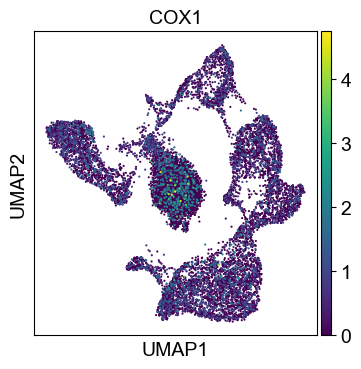

In [48]:
sc.pl.umap(adata, color=['COX1'])

In [49]:
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_0.2")

running Leiden clustering
    finished (0:00:04)


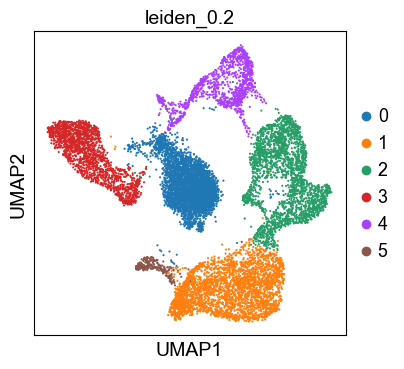

In [50]:
sc.pl.umap(adata, color=['leiden_0.2'])

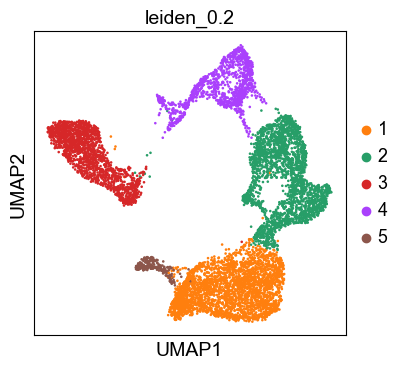

In [51]:
# Remove cluster 0
adata = adata[adata.obs['leiden_0.2'].astype(str) != '0'].copy()

# Remove the unused category label
adata.obs['leiden_0.2'] = adata.obs['leiden_0.2'].cat.remove_unused_categories()

# Plot remaining clusters
sc.pl.umap(adata, color='leiden_0.2')

__Re-running UMAP clustering without doublet influence__

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished (0:00:03)
computing UMAP
    finished (0:00:18)


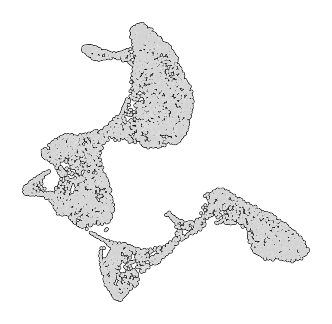

In [52]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=60)
sc.tl.umap(adata, n_components=2)
sc.pl.umap(adata, frameon=False, size=10, add_outline=True, save="_S03_07_umap.png")

** **

# __Section 4: Clustering algorithms and marker gene expression based annotation__

 __Topics__
- Leiden clustering algorithm
- Subsetting clusters & annotating cells based on Marker Gene threshold Expression

** **
 

In [53]:
# Route all Scanpy and Matplotlib figures in Section 4 here.
SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section4"]
SECTION_FIGURES_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = str(SECTION_FIGURES_DIR)

print("Current section figure directory:", SECTION_FIGURES_DIR)


Current section figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\figures\Section4-ClusteringAnnotation


__Part 1: Utilize the Leiden algorithm for broadly annotating cell clusters__

__Choose your Leiden resolution and run the algorithm on our adata's manifold projection (UMAP)__

In [54]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.05, key_added = "leiden_0.05")
sc.tl.leiden(adata, resolution = 0.1, key_added = "leiden_0.1")
sc.tl.leiden(adata, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata, resolution = 0.8, key_added = "leiden_0.8")
sc.tl.leiden(adata, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(adata, resolution = 10.0, key_added = "leiden_10.0")

running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:01)
running Leiden clustering
    finished (0:00:02)
running Leiden clustering
    finished (0:00:02)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:05)


__Visualize the different Leiden resolutions__

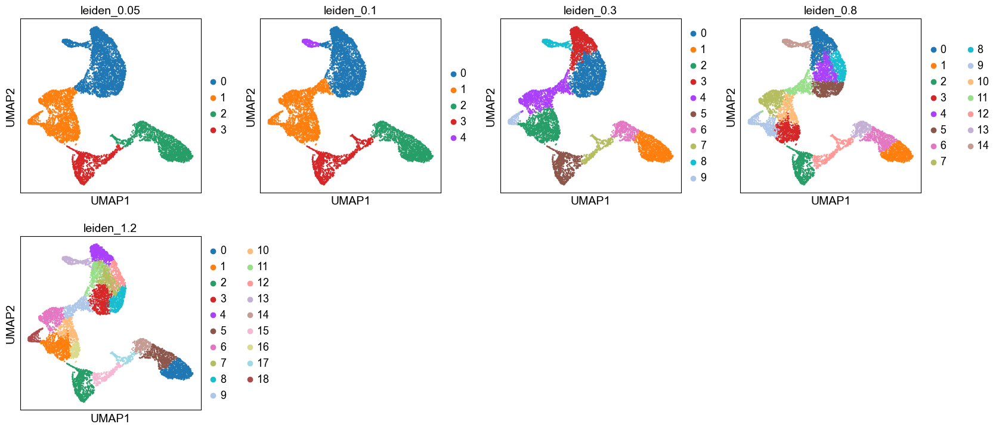

In [55]:
sc.pl.umap(adata, color=['leiden_0.05', 'leiden_0.1', 'leiden_0.3',  'leiden_0.8', 'leiden_1.2'], save="_S04_01_umap_leiden_0_05_leiden_0_1_leiden_0_3_leiden_0_8.png")

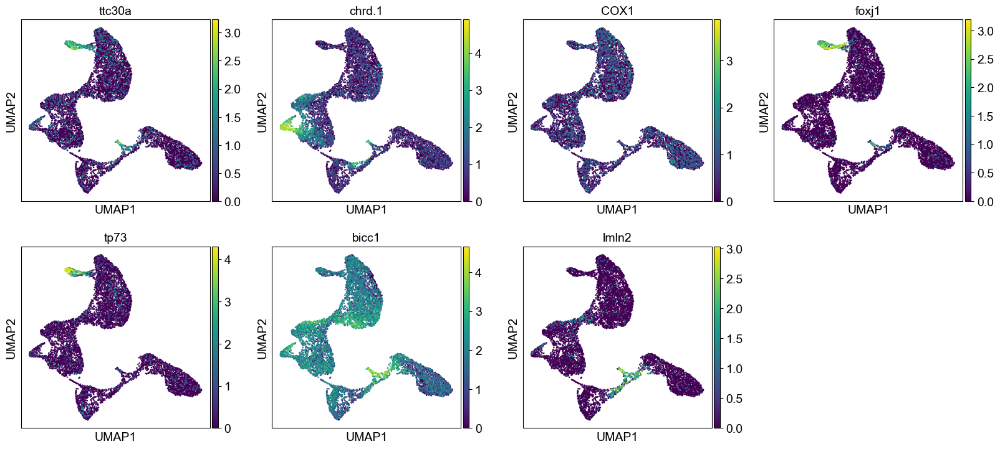

In [56]:
sc.pl.umap(adata, color=['ttc30a', 'chrd.1', 'COX1', 'foxj1', 'tp73', 'bicc1', 'lmln2'], palette="tab20", save="_S04_02_umap_ttc30a_chrd_1_cox1_foxj1.png")

__Part 2: Subsetting and Expression Based Annotation of leiden_0.05 - cluster "2"__

__First we subset cluster "2" from leiden_0.05__

In [57]:
# Subset clusters 2 and 6 from the leiden_0.1 column
adata_1 = adata[
    adata.obs["leiden_0.05"].astype(str).isin(["2"])
].copy()



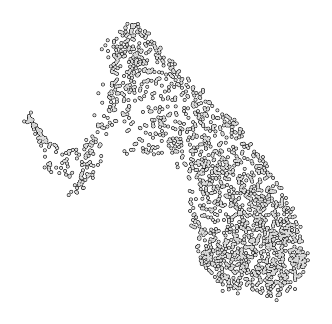

In [58]:
sc.pl.umap(adata_1, frameon=False, size=10, add_outline=True, save="_S04_03_umap.png")

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

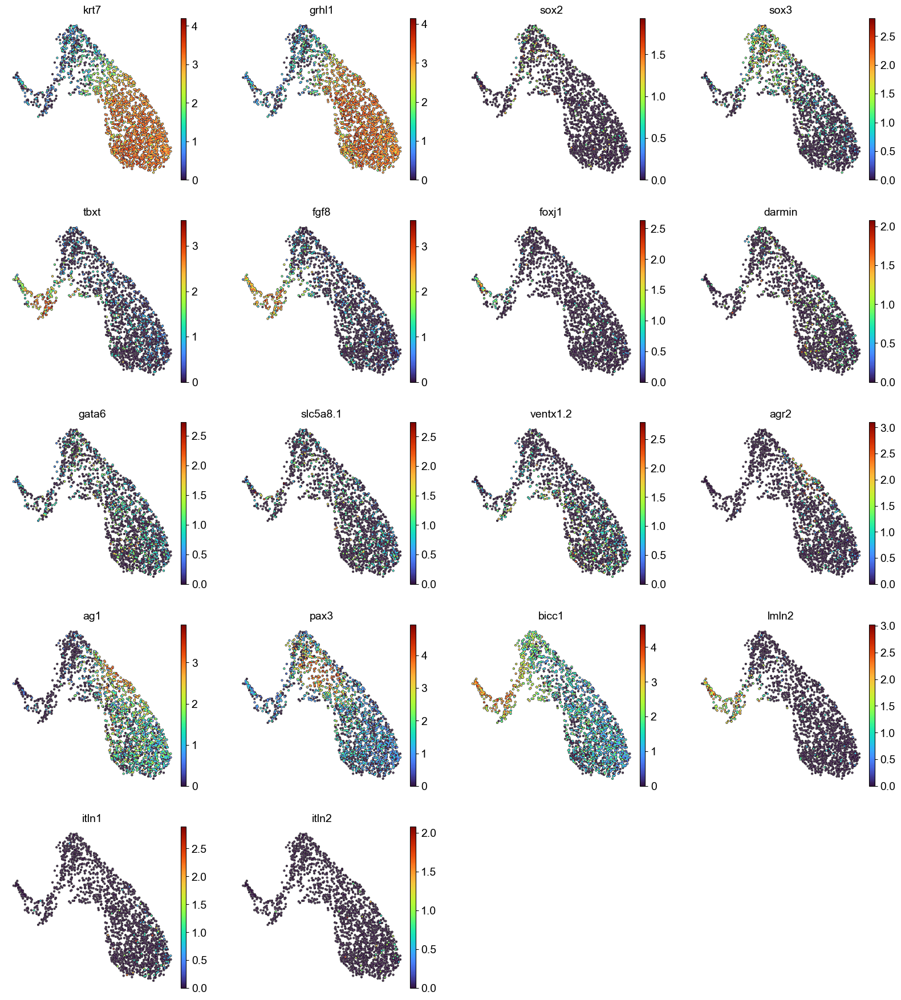

In [59]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'foxj1', 'darmin', 'gata6', 'slc5a8.1', 'ventx1.2', 'agr2', 'ag1', 'pax3', 'bicc1', 'lmln2', 'itln1', 'itln2']
sc.pl.umap(adata_1, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, save="_S04_04_umap_marker_panel.png")

__Annotating cell's based on a threshold of marker gene expression__

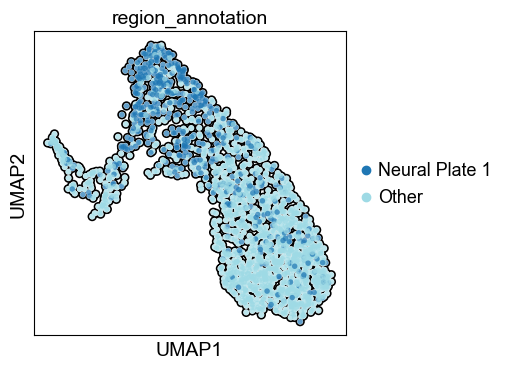

In [60]:
# Define a threshold for "high" expression
threshold = .5  # adjust based on your data (you might use 0.5, 1, or a quantile)

# Logical mask: cells where both rax and pax6 are highly expressed
mask = (adata_1[:, 'sox3'].X > threshold).toarray().flatten()

# Create a new column for annotation if it doesn't exist
adata_1.obs['region_annotation'] = 'Other'

# Assign "Anterior Neural Plate" to cells meeting the condition
adata_1.obs.loc[mask, 'region_annotation'] = 'Neural Plate 1'
sc.pl.umap(adata_1, color = "region_annotation", add_outline=True, palette="tab20")

region_annotation
Other                     1268
Neural Plate 1             483
L/R Organizer Mesoderm     167
Name: count, dtype: int64


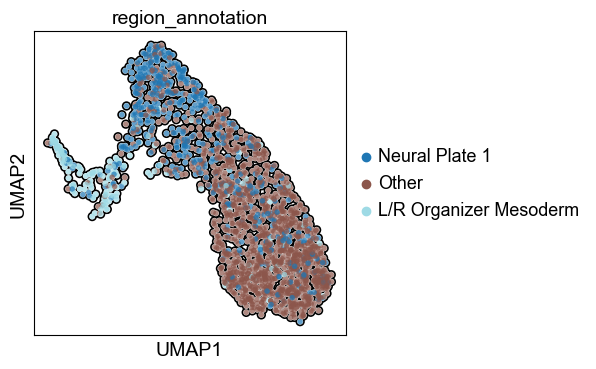

In [61]:
import numpy as np
from scipy import sparse

threshold = 0.05

def gene_mask(adata, gene, threshold):
    expression = adata[:, gene].X

    if sparse.issparse(expression):
        expression = expression.toarray()

    return np.asarray(expression).ravel() > threshold


# Cells expressing lmln2
lmln2_mask = gene_mask(adata_1, "lmln2", threshold)

# Only annotate cells currently labeled "Other"
other_mask = (
    adata_1.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

lr_organizer_mesoderm_mask = lmln2_mask & other_mask

# Add the new categorical label
new_label = "L/R Organizer Mesoderm"

if new_label not in adata_1.obs["region_annotation"].cat.categories:
    adata_1.obs["region_annotation"] = (
        adata_1.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the new annotation
adata_1.obs.loc[
    lr_organizer_mesoderm_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print(adata_1.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_1,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Goblet Cells assigned: 55
region_annotation
Other                     1213
Neural Plate 1             483
L/R Organizer Mesoderm     167
Goblet Cells                55
Name: count, dtype: int64


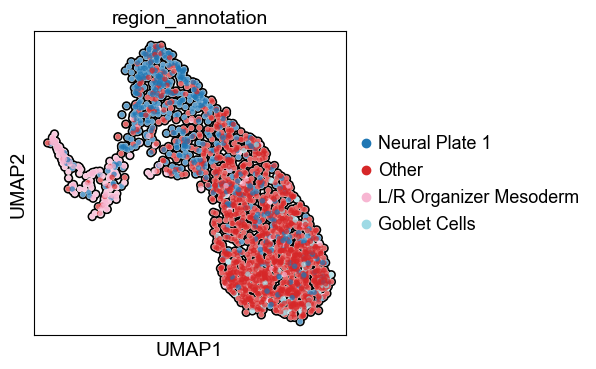

In [62]:
threshold = 0.05
new_label = "Goblet Cells"

# Cells expressing itln1 above the threshold
itln1_mask = gene_mask(
    adata_1,
    "itln1",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_1.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

goblet_cell_mask = itln1_mask & other_mask

# Add the new label as an allowed categorical value
if new_label not in adata_1.obs["region_annotation"].cat.categories:
    adata_1.obs["region_annotation"] = (
        adata_1.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_1.obs.loc[
    goblet_cell_mask,
    "region_annotation"
] = new_label

# Check counts
print("Goblet Cells assigned:", goblet_cell_mask.sum())
print(adata_1.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_1,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

region_annotation
Epidermis 1               1110
Neural Plate 1             483
L/R Organizer Mesoderm     167
Other                      103
Goblet Cells                55
Name: count, dtype: int64


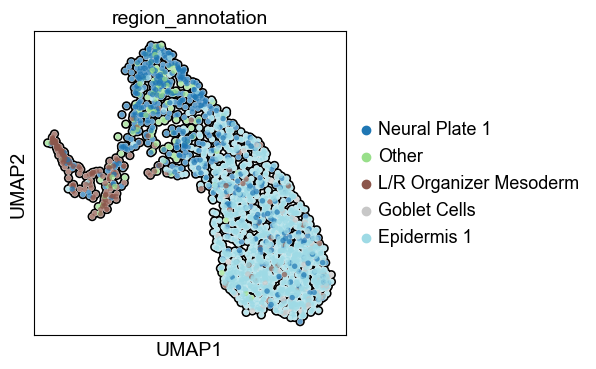

In [63]:
threshold = 0.05

# Cells expressing both krt7 and grhl1
krt7_mask = (
    adata_1[:, "krt7"].X > threshold
).toarray().flatten()

grhl1_mask = (
    adata_1[:, "grhl1"].X > threshold
).toarray().flatten()

# Only overwrite cells currently labeled Other
other_mask = (
    adata_1.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

epidermis1_mask = krt7_mask & grhl1_mask & other_mask

# Add Epidermis1 as an allowed categorical label
if "Epidermis1" not in adata_1.obs["region_annotation"].cat.categories:
    adata_1.obs["region_annotation"] = (
        adata_1.obs["region_annotation"]
        .cat.add_categories(["Epidermis 1"])
    )

# Apply the label
adata_1.obs.loc[
    epidermis1_mask,
    "region_annotation"
] = "Epidermis 1"

# Check counts
print(adata_1.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_1,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Cement Gland Primordium cells: 128
region_annotation
Epidermis 1                1021
Neural Plate 1              453
L/R Organizer Mesoderm      165
Cement Gland Primordium     128
Other                       101
Goblet Cells                 50
Name: count, dtype: int64


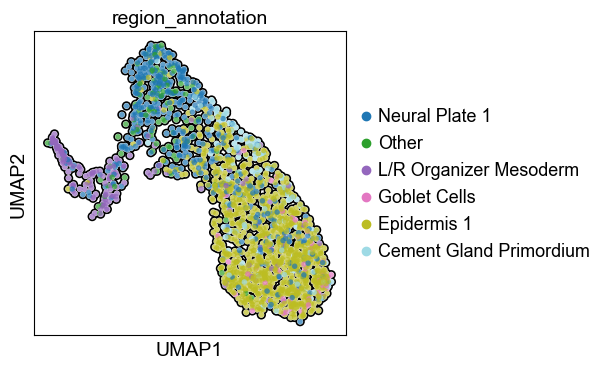

In [64]:
threshold = 0.05
new_label = "Cement Gland Primordium"  # Replace with your preferred annotation name

# Cells expressing agr2 above the threshold
agr2_mask = (
    adata_1[:, "agr2"].X > threshold
).toarray().flatten()

# Cells expressing ag1 above the threshold
ag1_mask = (
    adata_1[:, "ag1"].X > threshold
).toarray().flatten()

# Require both genes to exceed the threshold
agr2_ag1_mask = agr2_mask & ag1_mask

# Add the new label as an allowed categorical value
if new_label not in adata_1.obs["region_annotation"].cat.categories:
    adata_1.obs["region_annotation"] = (
        adata_1.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Overwrite the existing annotation for all double-positive cells
adata_1.obs.loc[
    agr2_ag1_mask,
    "region_annotation"
] = new_label

# Check counts
print(f"{new_label} cells:", agr2_ag1_mask.sum())
print(adata_1.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_1,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Neural Plate Border 1 cells assigned: 88
region_annotation
Epidermis 1                933
Neural Plate 1             453
L/R Organizer Mesoderm     165
Cement Gland Primordium    128
Other                      101
Neural Plate Border 1       88
Goblet Cells                50
Name: count, dtype: int64


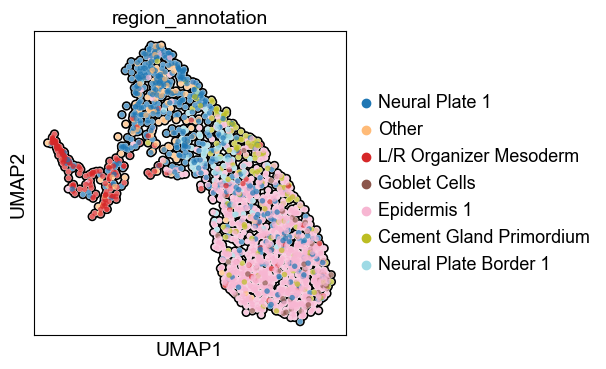

In [65]:
import numpy as np
from scipy import sparse

threshold = 2.0
new_label = "Neural Plate Border 1"  # Replace with your preferred annotation name

# Cells expressing pax3 above the threshold
pax3_expression = adata_1[:, "pax3"].X

if sparse.issparse(pax3_expression):
    pax3_expression = pax3_expression.toarray()

pax3_mask = np.asarray(pax3_expression).ravel() > threshold

# Only overwrite cells currently labeled "Epidermis 1"
epidermis1_mask = (
    adata_1.obs["region_annotation"]
    .eq("Epidermis 1")
    .to_numpy()
)

pax3_annotation_mask = pax3_mask & epidermis1_mask

# Add the new label as an allowed categorical value
if new_label not in adata_1.obs["region_annotation"].cat.categories:
    adata_1.obs["region_annotation"] = (
        adata_1.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Relabel pax3-positive Epidermis 1 cells
adata_1.obs.loc[
    pax3_annotation_mask,
    "region_annotation"
] = new_label

# Check counts
print(f"{new_label} cells assigned:", pax3_annotation_mask.sum())
print(adata_1.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_1,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

__Performing an additional Knn calculation on annotation labels to eliminate the "Other" annotation__

Iteration 1: assigned 101 cells; 0 remain Other.
Iteration 2: no additional Other cells could be assigned.

Final annotation counts:
region_annotation
Epidermis 1                940
Neural Plate 1             531
L/R Organizer Mesoderm     179
Cement Gland Primordium    129
Neural Plate Border 1       89
Goblet Cells                50
Name: count, dtype: int64


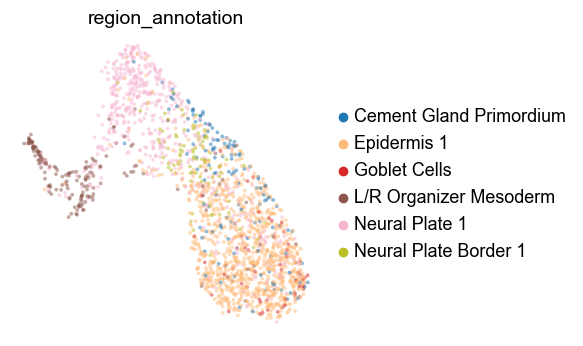

In [66]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Number of nearby cells in the existing UMAP to examine
n_neighbors = 3

# Number of iterative labeling rounds
maximum_iterations = 10

# Required fraction of the weighted vote
minimum_confidence = 0.35

# Preserve the existing UMAP coordinates
original_umap = adata_1.obsm["X_umap"].copy()

# Save labels before this procedure
adata_1.obs["region_annotation_before_umap_knn"] = (
    adata_1.obs[annotation_col].astype(str)
)

labels = adata_1.obs[annotation_col].astype(str).copy()

# Build KNN using the existing UMAP coordinates
knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(original_umap)

distances, neighbor_indices = knn.kneighbors(original_umap)

# Remove each cell itself from its neighbor list
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

for iteration in range(maximum_iterations):

    current_labels = labels.copy()

    other_positions = np.flatnonzero(
        current_labels.eq(unassigned_label).to_numpy()
    )

    assignments = {}

    for cell_pos in other_positions:

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Ignore neighbors that are also Other
        labeled_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[labeled_mask]
        neighbor_distances = cell_neighbor_distances[labeled_mask]

        if len(neighbor_labels) == 0:
            continue

        # Nearby cells receive greater voting weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label")["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        if confidence >= minimum_confidence:
            assignments[cell_pos] = best_label

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "no additional Other cells could be assigned."
        )
        break

    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

    print(
        f"Iteration {iteration + 1}: "
        f"assigned {len(assignments)} cells; "
        f"{labels.eq(unassigned_label).sum()} remain Other."
    )

# Store the updated annotations
adata_1.obs[annotation_col] = pd.Categorical(labels)

# Explicitly preserve the original embedding
adata_1.obsm["X_umap"] = original_umap

print("\nFinal annotation counts:")
print(adata_1.obs[annotation_col].value_counts())

# Plot using the unchanged UMAP coordinates
sc.pl.umap(
    adata_1,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_05_umap_annotation_col.png"
)

Iteration 1: 509 cells changed labels.
Iteration 2: 221 cells changed labels.
Iteration 3: 151 cells changed labels.
Iteration 4: 130 cells changed labels.
Iteration 5: 120 cells changed labels.

Total cells relabeled:
505

Label changes:
New label                Cement Gland Primordium  Epidermis 1  Goblet Cells  \
Original label                                                                
Cement Gland Primordium                        0           75             0   
Epidermis 1                                   21            0            10   
Goblet Cells                                   0           47             0   
L/R Organizer Mesoderm                         2           25             0   
Neural Plate 1                                 8          115             2   
Neural Plate Border 1                          4           32             0   

New label                L/R Organizer Mesoderm  Neural Plate 1  \
Original label                                               

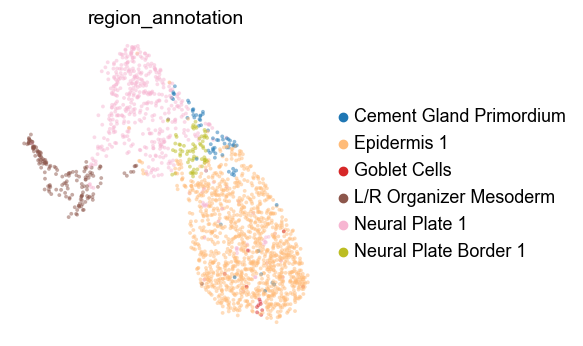

In [67]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Local boundary-smoothing settings
n_neighbors = 5
minimum_confidence = 0.50
minimum_labeled_neighbors = 5
maximum_iterations = 5

# ------------------------------------------------------------
# Preserve labels and the existing UMAP
# ------------------------------------------------------------

if "X_umap" not in adata_1.obsm:
    raise KeyError("adata_1.obsm['X_umap'] does not exist.")

umap_coordinates = adata_1.obsm["X_umap"].copy()

adata_1.obs["region_annotation_before_smoothing"] = (
    adata_1.obs[annotation_col].astype(str)
)

labels = adata_1.obs[annotation_col].astype(str).copy()

# Track which cells changed
last_confidence = pd.Series(
    np.nan,
    index=adata_1.obs_names,
    dtype=float
)

# ------------------------------------------------------------
# Construct neighbors using the existing UMAP coordinates
# ------------------------------------------------------------

knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(umap_coordinates)

distances, neighbor_indices = knn.kneighbors(umap_coordinates)

# Remove each cell itself
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

# ------------------------------------------------------------
# Iteratively smooth all annotation boundaries
# ------------------------------------------------------------

for iteration in range(maximum_iterations):

    # Snapshot prevents changes from propagating within the same iteration
    current_labels = labels.copy()

    assignments = {}
    confidences = {}

    for cell_pos in range(adata_1.n_obs):

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Do not allow Other cells to determine the winning annotation
        valid_neighbor_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[valid_neighbor_mask]
        neighbor_distances = cell_neighbor_distances[valid_neighbor_mask]

        if len(neighbor_labels) < minimum_labeled_neighbors:
            continue

        # Nearby neighbors receive more weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label", observed=True)["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        current_label = current_labels.iloc[cell_pos]

        # Change the label only when the local vote is sufficiently strong
        if (
            confidence >= minimum_confidence
            and best_label != current_label
        ):
            assignments[cell_pos] = best_label
            confidences[cell_pos] = confidence

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "labels have stabilized."
        )
        break

    # Apply all changes simultaneously
    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

        cell_name = adata_1.obs_names[cell_pos]
        last_confidence.loc[cell_name] = confidences[cell_pos]

    print(
        f"Iteration {iteration + 1}: "
        f"{len(assignments)} cells changed labels."
    )

# ------------------------------------------------------------
# Save smoothed annotations
# ------------------------------------------------------------

adata_1.obs[annotation_col] = pd.Categorical(labels)

adata_1.obs["boundary_smoothing_confidence"] = (
    last_confidence
)

before_labels = (
    adata_1.obs["region_annotation_before_smoothing"]
    .astype(str)
)

after_labels = (
    adata_1.obs[annotation_col]
    .astype(str)
)

adata_1.obs["label_changed_by_smoothing"] = (
    before_labels != after_labels
)

# Ensure the UMAP coordinates remain unchanged
assert np.array_equal(
    adata_1.obsm["X_umap"],
    umap_coordinates
)

# ------------------------------------------------------------
# Display changes
# ------------------------------------------------------------

changed_mask = adata_1.obs["label_changed_by_smoothing"]

print("\nTotal cells relabeled:")
print(changed_mask.sum())

print("\nLabel changes:")
print(
    pd.crosstab(
        before_labels[changed_mask],
        after_labels[changed_mask],
        rownames=["Original label"],
        colnames=["New label"]
    )
)

print("\nFinal annotation counts:")
print(
    adata_1.obs[annotation_col].value_counts()
)

# ------------------------------------------------------------
# Plot on the unchanged UMAP
# ------------------------------------------------------------

sc.pl.umap(
    adata_1,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_06_umap_annotation_col.png"
)

__Recombine our annotated subsetted data with our original adata UMAP under the column "region_annotation"__

In [68]:
import pandas as pd

annotation_col = "region_annotation"

# Initialize the column if it does not exist
if annotation_col not in adata.obs.columns:
    adata.obs[annotation_col] = "Unknown"

# Convert to strings so new labels can be assigned freely
adata.obs[annotation_col] = adata.obs[annotation_col].astype(str)

# Find cells shared between adata and adata_1
shared_cells = adata.obs_names.intersection(adata_1.obs_names)

# Transfer annotations using aligned cell IDs
adata.obs.loc[shared_cells, annotation_col] = (
    adata_1.obs.loc[shared_cells, annotation_col]
    .astype(str)
    .values
)

# Convert back to categorical after all labels are transferred
adata.obs[annotation_col] = pd.Categorical(
    adata.obs[annotation_col]
)

# Check the results
print("Shared cells updated:", len(shared_cells))
print(adata.obs[annotation_col].value_counts())

Shared cells updated: 1918
region_annotation
Unknown                    6680
Epidermis 1                1146
Neural Plate 1              463
L/R Organizer Mesoderm      163
Cement Gland Primordium      67
Neural Plate Border 1        66
Goblet Cells                 13
Name: count, dtype: int64


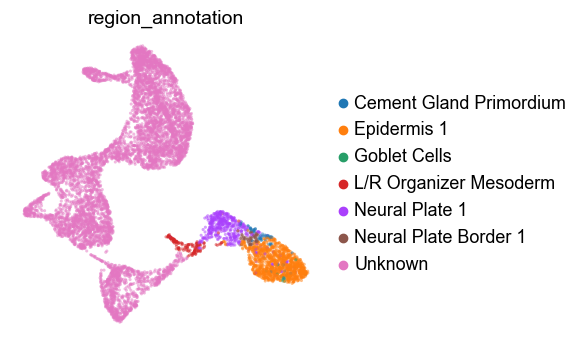

In [69]:
sc.pl.umap(adata, color='region_annotation', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_07_umap_region_annotation.png")

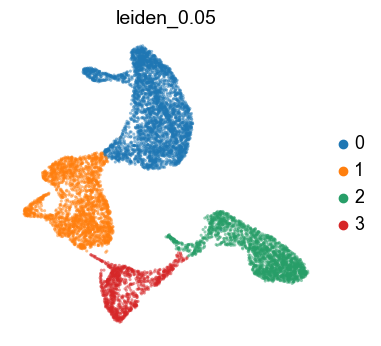

In [70]:
sc.pl.umap(adata, color='leiden_0.05', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_08_umap_leiden_0_05.png")

__Part 3: Subsetting and Expression Based Annotation of leiden_0.05 - cluster "3"__

__Subset cluster 3 from leiden_0.05__

In [71]:
# Subset the AnnData object to include only cells with the "3" annotation in the leiden_0.05 column
adata_2 = adata[adata.obs['leiden_0.05'] == '3'].copy()

# adata_2 now contains only the cells with a "3" annotation in the leiden_0.1 column

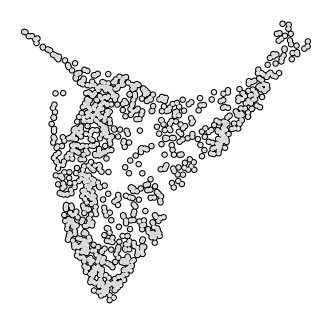

In [72]:
sc.pl.umap(adata_2, frameon=False, size=30, add_outline=True, save="_S04_09_umap.png")

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

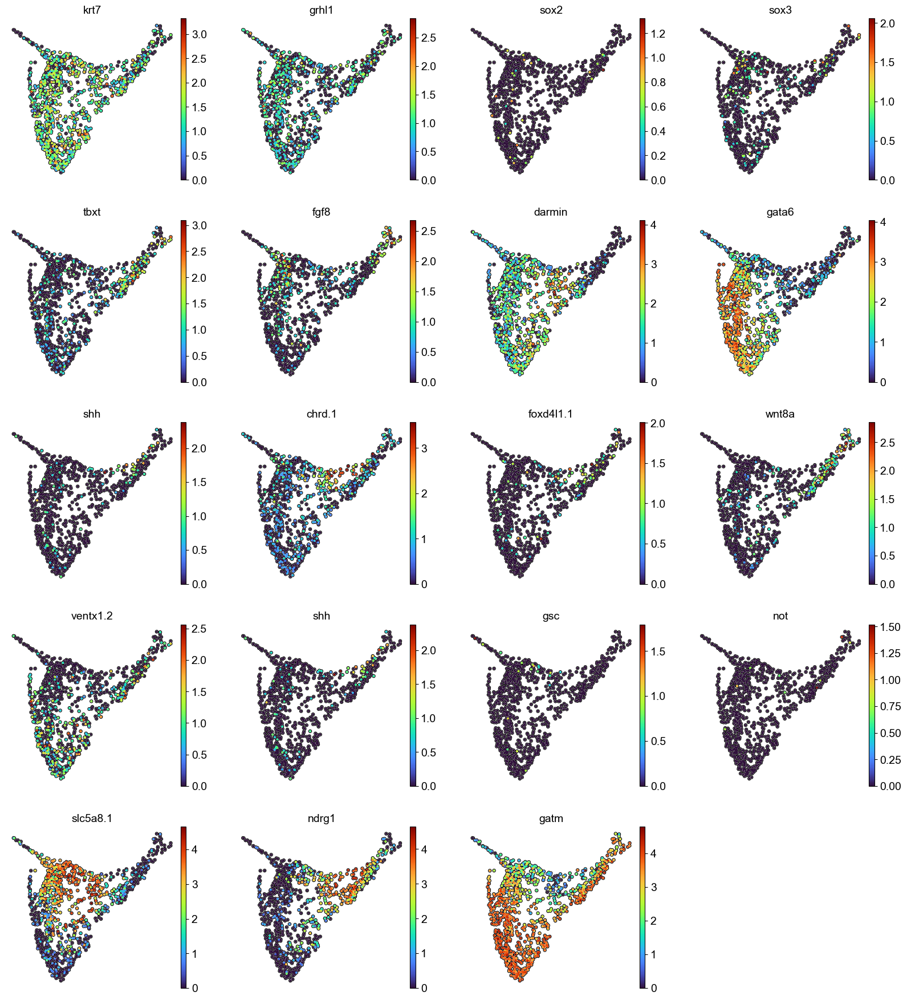

In [73]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'darmin', 'gata6', 'shh', 'chrd.1', 'foxd4l1.1', 'wnt8a', 'ventx1.2', 'shh', 'gsc', 'not', 'slc5a8.1', 'ndrg1', 'gatm']
sc.pl.umap(adata_2, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=30, frameon=False, legend_fontsize=12, alpha=1, save="_S04_10_umap_marker_panel.png")

__Annotating cell's based on a threshold of marker gene expression__

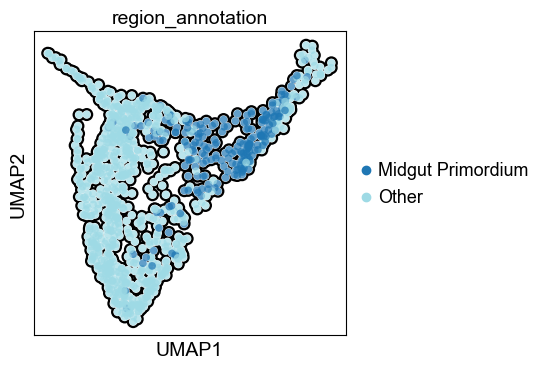

In [74]:
# Define a threshold for "high" expression
threshold = 2.0  # adjust based on your data (you might use 0.5, 1, or a quantile)

# Logical mask: cells where both rax and pax6 are highly expressed
mask = (adata_2[:, 'ndrg1'].X > threshold).toarray().flatten()

# Create a new column for annotation if it doesn't exist
adata_2.obs['region_annotation'] = 'Other'

# Assign "Anterior Neural Plate" to cells meeting the condition
adata_2.obs.loc[mask, 'region_annotation'] = 'Midgut Primordium'
sc.pl.umap(adata_2, color = "region_annotation", add_outline=True, palette="tab20")

Foregut Primordium cells assigned: 373
region_annotation
Other                 391
Foregut Primordium    373
Midgut Primordium     216
Name: count, dtype: int64


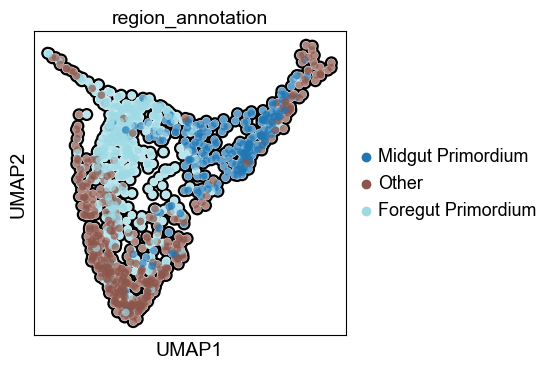

In [75]:
import numpy as np
import scanpy as sc
from scipy import sparse

threshold = 1.0
annotation_col = "region_annotation"
new_label = "Foregut Primordium"

def gene_mask(adata, gene, threshold):
    expression = adata[:, gene].X

    if sparse.issparse(expression):
        expression = expression.toarray()

    return np.asarray(expression).ravel() > threshold


# Cells expressing slc5a8.1 above the threshold
slc5a8_mask = gene_mask(
    adata_2,
    "slc5a8.1",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_2.obs[annotation_col]
    .eq("Other")
    .to_numpy()
)

# slc5a8.1-positive cells currently labeled Other
dorsal_endoderm_mask = slc5a8_mask & other_mask

# Add the new label to the categorical column if necessary
if new_label not in adata_2.obs[annotation_col].cat.categories:
    adata_2.obs[annotation_col] = (
        adata_2.obs[annotation_col]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_2.obs.loc[
    dorsal_endoderm_mask,
    annotation_col
] = new_label

# Check counts
print(f"{new_label} cells assigned:", dorsal_endoderm_mask.sum())
print(adata_2.obs[annotation_col].value_counts())

# Plot
sc.pl.umap(
    adata_2,
    color=annotation_col,
    add_outline=True,
    palette="tab20"
)

Hindgut Primordium cells assigned: 387
region_annotation
Hindgut Primordium    387
Foregut Primordium    373
Midgut Primordium     216
Other                   4
Name: count, dtype: int64


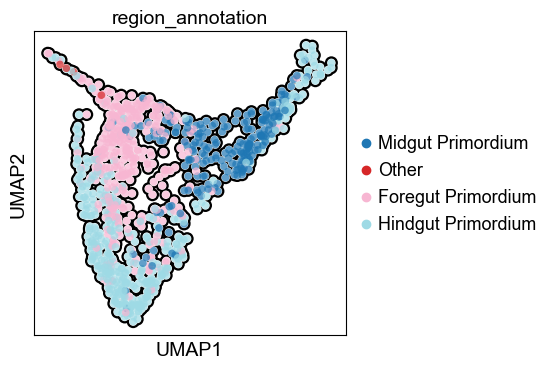

In [76]:
import numpy as np
import scanpy as sc
from scipy import sparse

threshold = 0.05
annotation_col = "region_annotation"
new_label = "Hindgut Primordium"

def gene_mask(adata, gene, threshold):
    expression = adata[:, gene].X

    if sparse.issparse(expression):
        expression = expression.toarray()

    return np.asarray(expression).ravel() > threshold


# Cells expressing gatm above the threshold
gatm_mask = gene_mask(
    adata_2,
    "gatm",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_2.obs[annotation_col]
    .eq("Other")
    .to_numpy()
)

# gatm-positive cells currently labeled Other
ventral_endoderm_mask = gatm_mask & other_mask

# Add the new label to the categorical column if necessary
if new_label not in adata_2.obs[annotation_col].cat.categories:
    adata_2.obs[annotation_col] = (
        adata_2.obs[annotation_col]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_2.obs.loc[
    ventral_endoderm_mask,
    annotation_col
] = new_label

# Check counts
print(f"{new_label} cells assigned:", ventral_endoderm_mask.sum())
print(adata_2.obs[annotation_col].value_counts())

# Plot
sc.pl.umap(
    adata_2,
    color=annotation_col,
    add_outline=True,
    palette="tab20"
)

__Performing an additional Knn calculation on annotation labels to eliminate the "Other" annotation__

Iteration 1: assigned 4 cells; 0 remain Other.
Iteration 2: no additional Other cells could be assigned.

Final annotation counts:
region_annotation
Hindgut Primordium    390
Foregut Primordium    374
Midgut Primordium     216
Name: count, dtype: int64


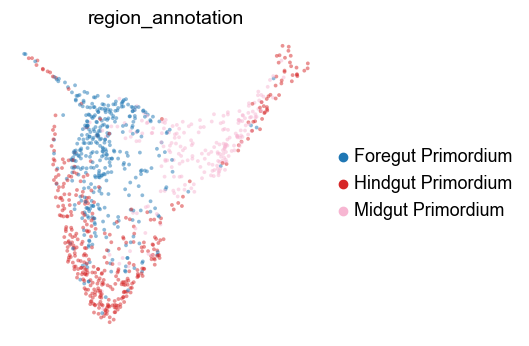

In [77]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Number of nearby cells in the existing UMAP to examine
n_neighbors = 30

# Number of iterative labeling rounds
maximum_iterations = 10

# Required fraction of the weighted vote
minimum_confidence = 0.5

# Preserve the existing UMAP coordinates
original_umap = adata_2.obsm["X_umap"].copy()

# Save labels before this procedure
adata_2.obs["region_annotation_before_umap_knn"] = (
    adata_2.obs[annotation_col].astype(str)
)

labels = adata_2.obs[annotation_col].astype(str).copy()

# Build KNN using the existing UMAP coordinates
knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(original_umap)

distances, neighbor_indices = knn.kneighbors(original_umap)

# Remove each cell itself from its neighbor list
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

for iteration in range(maximum_iterations):

    current_labels = labels.copy()

    other_positions = np.flatnonzero(
        current_labels.eq(unassigned_label).to_numpy()
    )

    assignments = {}

    for cell_pos in other_positions:

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Ignore neighbors that are also Other
        labeled_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[labeled_mask]
        neighbor_distances = cell_neighbor_distances[labeled_mask]

        if len(neighbor_labels) == 0:
            continue

        # Nearby cells receive greater voting weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label")["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        if confidence >= minimum_confidence:
            assignments[cell_pos] = best_label

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "no additional Other cells could be assigned."
        )
        break

    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

    print(
        f"Iteration {iteration + 1}: "
        f"assigned {len(assignments)} cells; "
        f"{labels.eq(unassigned_label).sum()} remain Other."
    )

# Store the updated annotations
adata_2.obs[annotation_col] = pd.Categorical(labels)

# Explicitly preserve the original embedding
adata_2.obsm["X_umap"] = original_umap

print("\nFinal annotation counts:")
print(adata_2.obs[annotation_col].value_counts())

# Plot using the unchanged UMAP coordinates
sc.pl.umap(
    adata_2,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_11_umap_annotation_col.png"
)

Iteration 1: 74 cells changed labels.
Iteration 2: 27 cells changed labels.
Iteration 3: 14 cells changed labels.
Iteration 4: 12 cells changed labels.
Iteration 5: 7 cells changed labels.

Total cells relabeled:
126

Label changes:
New label           Foregut Primordium  Hindgut Primordium  Midgut Primordium
Original label                                                               
Foregut Primordium                   0                  33                 14
Hindgut Primordium                  30                   0                 16
Midgut Primordium                   20                  13                  0

Final annotation counts:
region_annotation
Hindgut Primordium    390
Foregut Primordium    377
Midgut Primordium     213
Name: count, dtype: int64


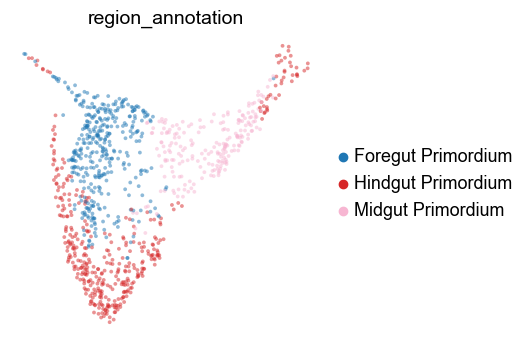

In [78]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Local boundary-smoothing settings
n_neighbors = 50
minimum_confidence = 0.70
minimum_labeled_neighbors = 5
maximum_iterations = 5

# ------------------------------------------------------------
# Preserve labels and the existing UMAP
# ------------------------------------------------------------

if "X_umap" not in adata_2.obsm:
    raise KeyError("adata_2.obsm['X_umap'] does not exist.")

umap_coordinates = adata_2.obsm["X_umap"].copy()

adata_2.obs["region_annotation_before_smoothing"] = (
    adata_2.obs[annotation_col].astype(str)
)

labels = adata_2.obs[annotation_col].astype(str).copy()

# Track which cells changed
last_confidence = pd.Series(
    np.nan,
    index=adata_2.obs_names,
    dtype=float
)

# ------------------------------------------------------------
# Construct neighbors using the existing UMAP coordinates
# ------------------------------------------------------------

knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(umap_coordinates)

distances, neighbor_indices = knn.kneighbors(umap_coordinates)

# Remove each cell itself
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

# ------------------------------------------------------------
# Iteratively smooth all annotation boundaries
# ------------------------------------------------------------

for iteration in range(maximum_iterations):

    # Snapshot prevents changes from propagating within the same iteration
    current_labels = labels.copy()

    assignments = {}
    confidences = {}

    for cell_pos in range(adata_2.n_obs):

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Do not allow Other cells to determine the winning annotation
        valid_neighbor_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[valid_neighbor_mask]
        neighbor_distances = cell_neighbor_distances[valid_neighbor_mask]

        if len(neighbor_labels) < minimum_labeled_neighbors:
            continue

        # Nearby neighbors receive more weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label", observed=True)["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        current_label = current_labels.iloc[cell_pos]

        # Change the label only when the local vote is sufficiently strong
        if (
            confidence >= minimum_confidence
            and best_label != current_label
        ):
            assignments[cell_pos] = best_label
            confidences[cell_pos] = confidence

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "labels have stabilized."
        )
        break

    # Apply all changes simultaneously
    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

        cell_name = adata_2.obs_names[cell_pos]
        last_confidence.loc[cell_name] = confidences[cell_pos]

    print(
        f"Iteration {iteration + 1}: "
        f"{len(assignments)} cells changed labels."
    )

# ------------------------------------------------------------
# Save smoothed annotations
# ------------------------------------------------------------

adata_2.obs[annotation_col] = pd.Categorical(labels)

adata_2.obs["boundary_smoothing_confidence"] = (
    last_confidence
)

before_labels = (
    adata_2.obs["region_annotation_before_smoothing"]
    .astype(str)
)

after_labels = (
    adata_2.obs[annotation_col]
    .astype(str)
)

adata_2.obs["label_changed_by_smoothing"] = (
    before_labels != after_labels
)

# Ensure the UMAP coordinates remain unchanged
assert np.array_equal(
    adata_2.obsm["X_umap"],
    umap_coordinates
)

# ------------------------------------------------------------
# Display changes
# ------------------------------------------------------------

changed_mask = adata_2.obs["label_changed_by_smoothing"]

print("\nTotal cells relabeled:")
print(changed_mask.sum())

print("\nLabel changes:")
print(
    pd.crosstab(
        before_labels[changed_mask],
        after_labels[changed_mask],
        rownames=["Original label"],
        colnames=["New label"]
    )
)

print("\nFinal annotation counts:")
print(
    adata_2.obs[annotation_col].value_counts()
)

# ------------------------------------------------------------
# Plot on the unchanged UMAP
# ------------------------------------------------------------

sc.pl.umap(
    adata_2,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_12_umap_annotation_col.png"
)

__Recombine our annotated subsetted data with our original adata UMAP under the column "region_annotation"__

In [79]:
# Extract unique categories from adata_2
new_categories_2 = adata_2.obs['region_annotation'].unique()

# Get the current categories in adata
current_categories_R = adata.obs['region_annotation'].cat.categories

# Filter out the new categories that already exist in adata
categories_to_add = [cat for cat in new_categories_2 if cat not in current_categories_R]

# If there are new categories to add, update adata.obs['category'] to include these new categories
if categories_to_add:
    adata.obs['region_annotation'] = adata.obs['region_annotation'].cat.add_categories(categories_to_add)

# Now proceed to update the 'category' in adata based on annotations in adata_2
for cell_id in adata_2.obs_names:
    # Ensure the cell_id exists in adata to avoid KeyErrors
    if cell_id in adata.obs_names:
        # Update the category in adata with the category from adata_2
        adata.obs.at[cell_id, 'region_annotation'] = adata_2.obs.at[cell_id, 'region_annotation']

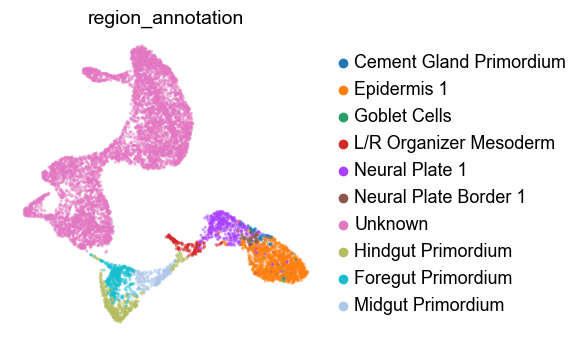

In [80]:
sc.pl.umap(adata, color='region_annotation', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_13_umap_region_annotation.png")

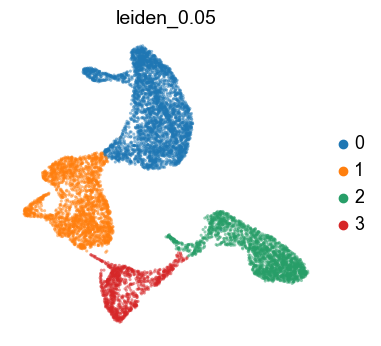

In [81]:
sc.pl.umap(adata, color='leiden_0.05', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_14_umap_leiden_0_05.png")

__Part 4: Subsetting and Expression Based Annotation of leiden_0.05 - cluster "0"__

__Subset cluster 0 from leiden_0.05__

In [82]:
# Subset the AnnData object to include only cells with the "0" annotation in the leiden_0.1 column
adata_0 = adata[adata.obs['leiden_0.05'] == '0'].copy()

# adata_0 now contains only the cells with a "0" annotation in the leiden_0.1 column

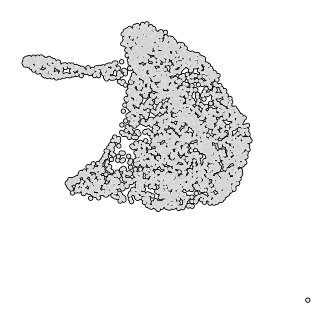

In [83]:
sc.pl.umap(adata_0, frameon=False, size=20, add_outline=True, save="_S04_15_umap.png")

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

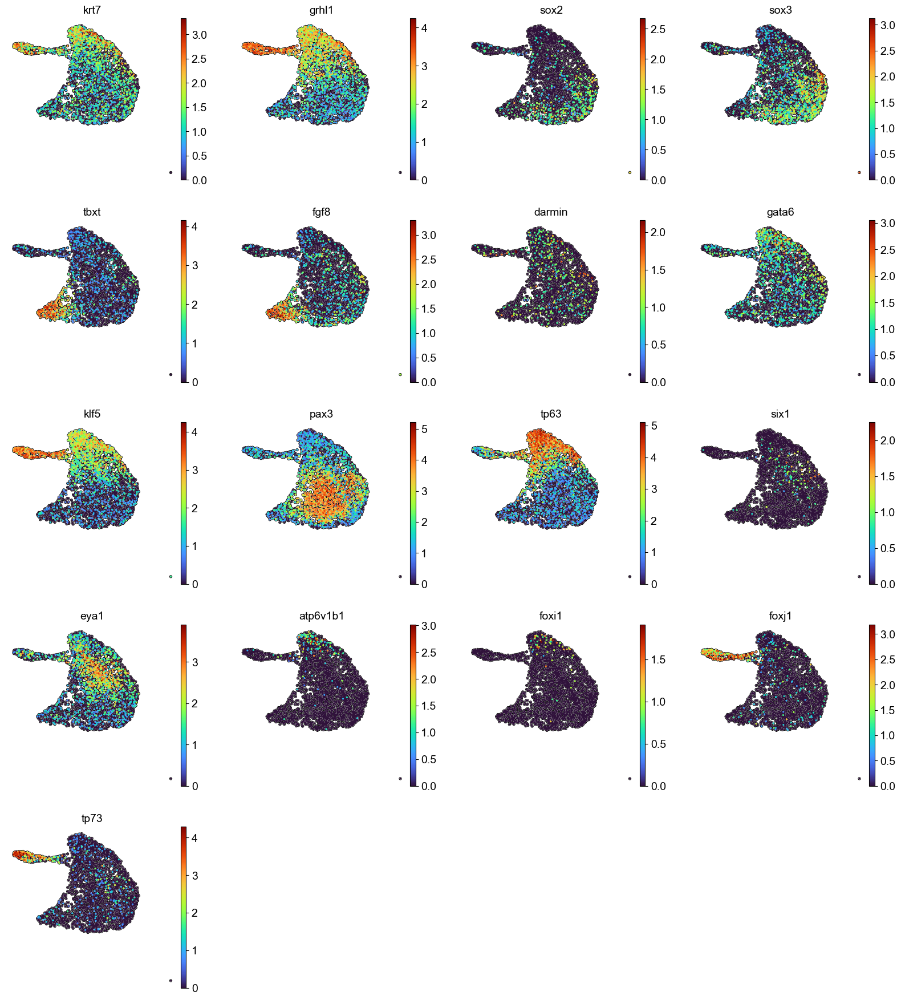

In [84]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'darmin', 'gata6', 'klf5', 'pax3', 'tp63', 'six1', 'eya1', 'atp6v1b1', 'foxi1', 'foxj1', 'tp73']
sc.pl.umap(adata_0, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=20, frameon=False, legend_fontsize=12, alpha=1, save="_S04_16_umap_marker_panel.png")

__Annotating cell's based on a threshold of marker gene expression__

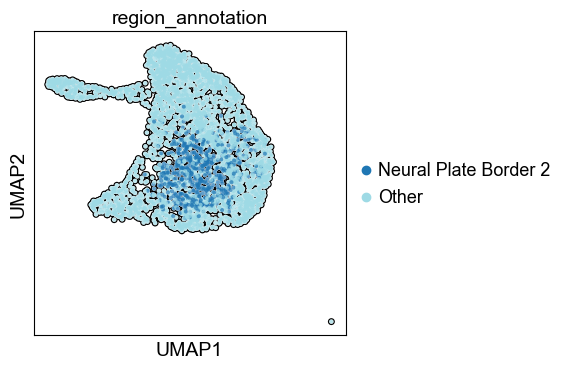

In [85]:
# Define a threshold for "high" expression
threshold = 3.5  # adjust based on your data (you might use 0.5, 1, or a quantile)

# Logical mask: cells where both rax and pax6 are highly expressed
mask = (adata_0[:, 'pax3'].X > threshold).toarray().flatten()

# Create a new column for annotation if it doesn't exist
adata_0.obs['region_annotation'] = 'Other'

# Assign "Anterior Neural Plate" to cells meeting the condition
adata_0.obs.loc[mask, 'region_annotation'] = 'Neural Plate Border 2'
sc.pl.umap(adata_0, color = "region_annotation", add_outline=True, palette="tab20")

Epidermis 2: 1160
region_annotation
Other                    1747
Epidermis 2              1160
Neural Plate Border 2     562
Name: count, dtype: int64


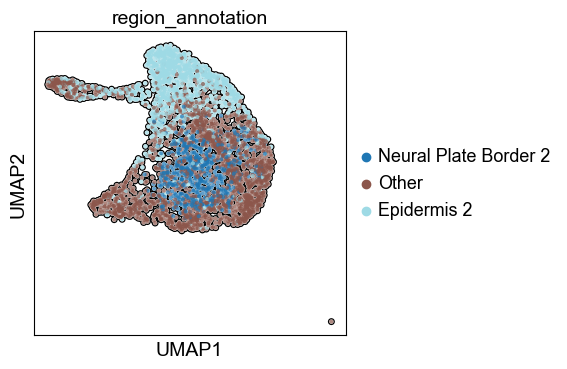

In [86]:
threshold = 1.5
new_label = "Epidermis 2"

# Cells expressing tp63 above the threshold
tp63_mask = gene_mask(
    adata_0,
    "tp63",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_0.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

tp63_positive_mask = tp63_mask & other_mask

# Add the new categorical label
if new_label not in adata_0.obs["region_annotation"].cat.categories:
    adata_0.obs["region_annotation"] = (
        adata_0.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_0.obs.loc[
    tp63_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Epidermis 2:", tp63_positive_mask.sum())
print(adata_0.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Neuroectoderm 2: 32
region_annotation
Other                    1715
Epidermis 2              1160
Neural Plate Border 2     562
Eye Primordium             32
Name: count, dtype: int64


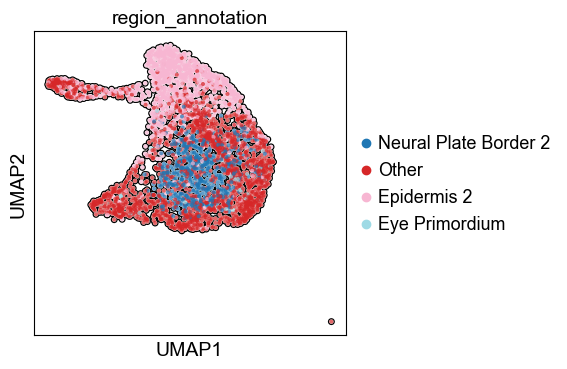

In [87]:
threshold = 0.05
new_label = "Eye Primordium"

# Cells expressing rax above the threshold
rax_mask = gene_mask(
    adata_0,
    "rax",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_0.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

rax_positive_mask = rax_mask & other_mask

# Add the new categorical label
if new_label not in adata_0.obs["region_annotation"].cat.categories:
    adata_0.obs["region_annotation"] = (
        adata_0.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_0.obs.loc[
    rax_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Neuroectoderm 2:", rax_positive_mask.sum())
print(adata_0.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Hindbrain Primordium: 90
region_annotation
Other                    1625
Epidermis 2              1160
Neural Plate Border 2     562
Hindbrain Primordium       90
Eye Primordium             32
Name: count, dtype: int64


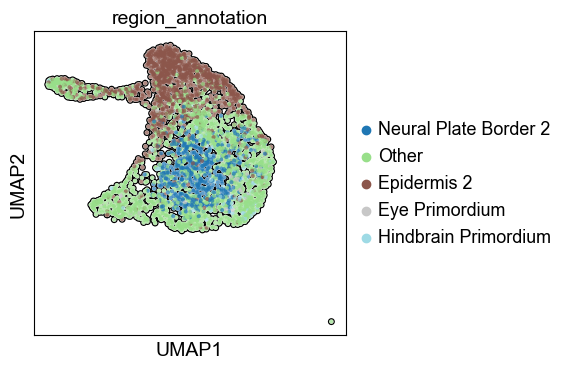

In [88]:
threshold = 0.05
new_label = "Hindbrain Primordium"

# Cells expressing pax2 above the threshold
pax2_mask = gene_mask(
    adata_0,
    "pax2",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_0.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

pax2_positive_mask = pax2_mask & other_mask

# Add the new categorical label
if new_label not in adata_0.obs["region_annotation"].cat.categories:
    adata_0.obs["region_annotation"] = (
        adata_0.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_0.obs.loc[
    pax2_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Hindbrain Primordium:", pax2_positive_mask.sum())
print(adata_0.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Neuroectoderm 2: 700
region_annotation
Epidermis 2              1160
Other                     925
Neural Plate 2            700
Neural Plate Border 2     562
Hindbrain Primordium       90
Eye Primordium             32
Name: count, dtype: int64


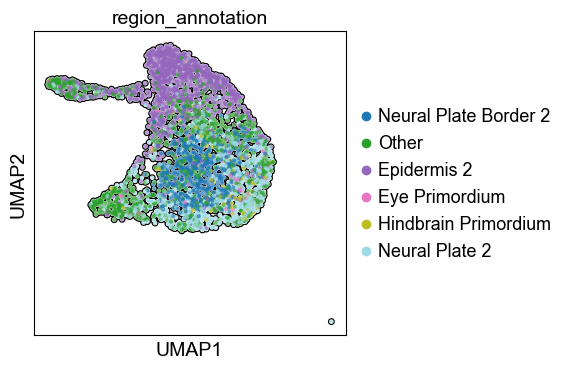

In [89]:
threshold = 0.05
new_label = "Neural Plate 2"

# Cells expressing sox3 above the threshold
sox3_mask = gene_mask(
    adata_0,
    "sox3",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_0.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

sox3_positive_mask = sox3_mask & other_mask

# Add the new categorical label
if new_label not in adata_0.obs["region_annotation"].cat.categories:
    adata_0.obs["region_annotation"] = (
        adata_0.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_0.obs.loc[
    sox3_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Neuroectoderm 2:", sox3_positive_mask.sum())
print(adata_0.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Pre-placodal Region: 420
region_annotation
Epidermis 2              1160
Neural Plate 2            700
Neural Plate Border 2     562
Other                     505
Pre-placodal Region       420
Hindbrain Primordium       90
Eye Primordium             32
Name: count, dtype: int64


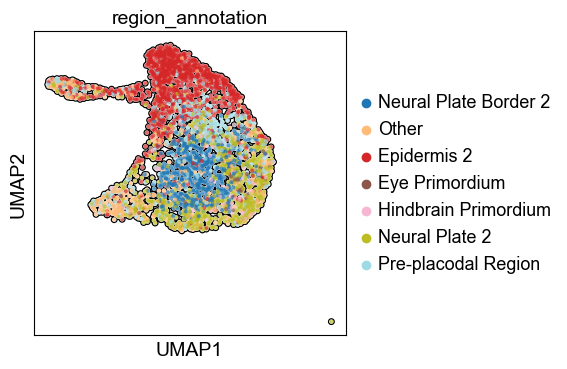

In [90]:
threshold = 0.05
new_label = "Pre-placodal Region"

# Cells expressing eya1 above the threshold
eya1_mask = gene_mask(
    adata_0,
    "eya1",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_0.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

eya1_positive_mask = eya1_mask & other_mask

# Add the new categorical label
if new_label not in adata_0.obs["region_annotation"].cat.categories:
    adata_0.obs["region_annotation"] = (
        adata_0.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_0.obs.loc[
    eya1_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Pre-placodal Region:", eya1_positive_mask.sum())
print(adata_0.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Ionocyte assigned: 137
region_annotation
Epidermis 2              1050
Neural Plate 2            691
Neural Plate Border 2     557
Other                     497
Pre-placodal Region       415
Ionocyte                  137
Hindbrain Primordium       90
Eye Primordium             32
Name: count, dtype: int64


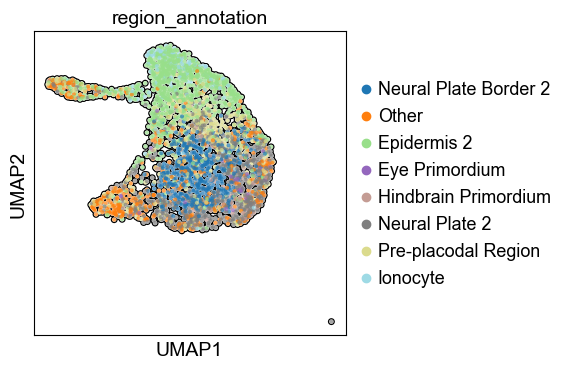

In [91]:
threshold = 0.05
new_label = "Ionocyte"
annotation_col = "region_annotation"

# Cells expressing atp6v1b1 above the threshold
atp6v1b1_mask = gene_mask(
    adata_0,
    "atp6v1b1",
    threshold
)

# Overwrite any existing annotation
ionocyte_mask = atp6v1b1_mask

# Add the new categorical label if necessary
if new_label not in adata_0.obs[annotation_col].cat.categories:
    adata_0.obs[annotation_col] = (
        adata_0.obs[annotation_col]
        .cat.add_categories([new_label])
    )

# Relabel every atp6v1b1-positive cell
adata_0.obs.loc[
    ionocyte_mask,
    annotation_col
] = new_label

# Check annotation counts
print("Ionocyte assigned:", ionocyte_mask.sum())
print(adata_0.obs[annotation_col].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color=annotation_col,
    add_outline=True,
    palette="tab20"
)

Ciliated Epidermal Progenitor assigned: 361
region_annotation
Epidermis 2                      919
Neural Plate 2                   637
Neural Plate Border 2            534
Other                            423
Ciliated Epidermal Progenitor    361
Pre-placodal Region              358
Ionocyte                         123
Hindbrain Primordium              85
Eye Primordium                    29
Name: count, dtype: int64


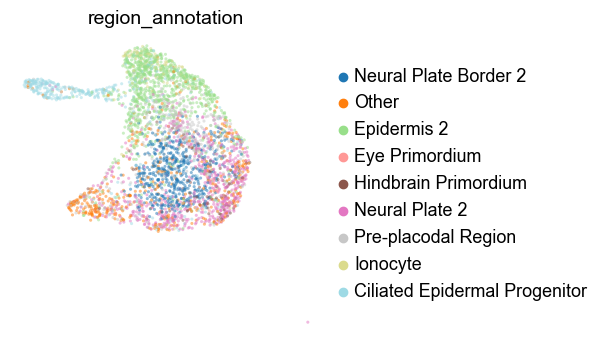

In [92]:
import pandas as pd
import scanpy as sc

threshold = 0.5
annotation_col = "region_annotation"
new_label = "Ciliated Epidermal Progenitor"

# Cells expressing tp73 above the threshold
tp73_mask = gene_mask(
    adata_0,
    "foxj1",
    threshold
)

# Overwrite any existing annotation
ciliated_progenitor_mask = tp73_mask

# Ensure the annotation column is categorical
if not isinstance(
    adata_0.obs[annotation_col].dtype,
    pd.CategoricalDtype
):
    adata_0.obs[annotation_col] = pd.Categorical(
        adata_0.obs[annotation_col]
    )

# Add the new category if necessary
if new_label not in adata_0.obs[annotation_col].cat.categories:
    adata_0.obs[annotation_col] = (
        adata_0.obs[annotation_col]
        .cat.add_categories([new_label])
    )

# Relabel every tp73-positive cell, regardless of its current label
adata_0.obs.loc[
    ciliated_progenitor_mask,
    annotation_col
] = new_label

# Check annotation counts
print(
    "Ciliated Epidermal Progenitor assigned:",
    ciliated_progenitor_mask.sum()
)
print(adata_0.obs[annotation_col].value_counts())

# Plot
sc.pl.umap(
    adata_0,
    color=annotation_col,
    frameon=False,
    size=20,
    add_outline=False,
    alpha=0.5,
    palette="tab20"
)

__Performing an additional Knn calculation on annotation labels to eliminate the "Other" annotation__

Iteration 1: assigned 409 cells; 14 remain Other.
Iteration 2: assigned 9 cells; 5 remain Other.
Iteration 3: assigned 5 cells; 0 remain Other.
Iteration 4: no additional Other cells could be assigned.

Final annotation counts:
region_annotation
Epidermis 2                      974
Neural Plate 2                   798
Neural Plate Border 2            608
Pre-placodal Region              440
Ciliated Epidermal Progenitor    393
Ionocyte                         127
Hindbrain Primordium              91
Eye Primordium                    38
Name: count, dtype: int64


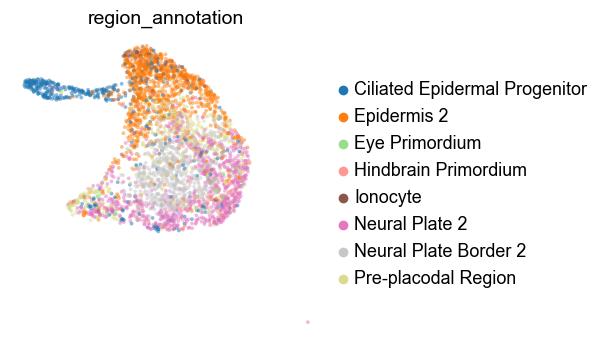

In [93]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Number of nearby cells in the existing UMAP to examine
n_neighbors = 5

# Number of iterative labeling rounds
maximum_iterations = 10

# Required fraction of the weighted vote
minimum_confidence = 0.25

# Preserve the existing UMAP coordinates
original_umap = adata_0.obsm["X_umap"].copy()

# Save labels before this procedure
adata_0.obs["region_annotation_before_umap_knn"] = (
    adata_0.obs[annotation_col].astype(str)
)

labels = adata_0.obs[annotation_col].astype(str).copy()

# Build KNN using the existing UMAP coordinates
knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(original_umap)

distances, neighbor_indices = knn.kneighbors(original_umap)

# Remove each cell itself from its neighbor list
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

for iteration in range(maximum_iterations):

    current_labels = labels.copy()

    other_positions = np.flatnonzero(
        current_labels.eq(unassigned_label).to_numpy()
    )

    assignments = {}

    for cell_pos in other_positions:

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Ignore neighbors that are also Other
        labeled_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[labeled_mask]
        neighbor_distances = cell_neighbor_distances[labeled_mask]

        if len(neighbor_labels) == 0:
            continue

        # Nearby cells receive greater voting weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label")["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        if confidence >= minimum_confidence:
            assignments[cell_pos] = best_label

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "no additional Other cells could be assigned."
        )
        break

    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

    print(
        f"Iteration {iteration + 1}: "
        f"assigned {len(assignments)} cells; "
        f"{labels.eq(unassigned_label).sum()} remain Other."
    )

# Store the updated annotations
adata_0.obs[annotation_col] = pd.Categorical(labels)

# Explicitly preserve the original embedding
adata_0.obsm["X_umap"] = original_umap

print("\nFinal annotation counts:")
print(adata_0.obs[annotation_col].value_counts())

# Plot using the unchanged UMAP coordinates
sc.pl.umap(
    adata_0,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_17_umap_annotation_col.png"
)

Iteration 1: 948 cells changed labels.
Iteration 2: 397 cells changed labels.
Iteration 3: 251 cells changed labels.
Iteration 4: 198 cells changed labels.
Iteration 5: 169 cells changed labels.

Total cells relabeled:
997

Label changes:
New label                      Ciliated Epidermal Progenitor  Epidermis 2  \
Original label                                                              
Ciliated Epidermal Progenitor                              0           61   
Epidermis 2                                               20            0   
Eye Primordium                                             0            2   
Hindbrain Primordium                                       0            6   
Ionocyte                                                   3           91   
Neural Plate 2                                            14           39   
Neural Plate Border 2                                      1           16   
Pre-placodal Region                                        7        

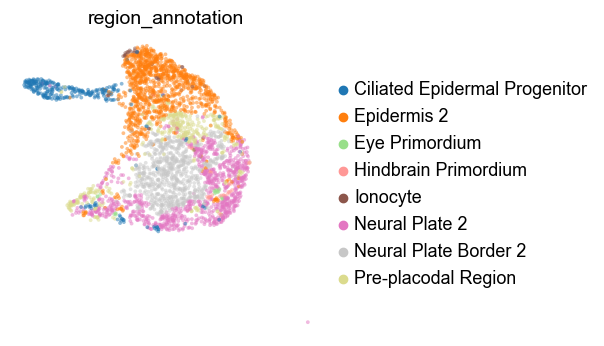

In [94]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Local boundary-smoothing settings
n_neighbors = 5
minimum_confidence = 0.50
minimum_labeled_neighbors = 5
maximum_iterations = 5

# ------------------------------------------------------------
# Preserve labels and the existing UMAP
# ------------------------------------------------------------

if "X_umap" not in adata_0.obsm:
    raise KeyError("adata_0.obsm['X_umap'] does not exist.")

umap_coordinates = adata_0.obsm["X_umap"].copy()

adata_0.obs["region_annotation_before_smoothing"] = (
    adata_0.obs[annotation_col].astype(str)
)

labels = adata_0.obs[annotation_col].astype(str).copy()

# Track which cells changed
last_confidence = pd.Series(
    np.nan,
    index=adata_0.obs_names,
    dtype=float
)

# ------------------------------------------------------------
# Construct neighbors using the existing UMAP coordinates
# ------------------------------------------------------------

knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(umap_coordinates)

distances, neighbor_indices = knn.kneighbors(umap_coordinates)

# Remove each cell itself
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

# ------------------------------------------------------------
# Iteratively smooth all annotation boundaries
# ------------------------------------------------------------

for iteration in range(maximum_iterations):

    # Snapshot prevents changes from propagating within the same iteration
    current_labels = labels.copy()

    assignments = {}
    confidences = {}

    for cell_pos in range(adata_0.n_obs):

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Do not allow Other cells to determine the winning annotation
        valid_neighbor_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[valid_neighbor_mask]
        neighbor_distances = cell_neighbor_distances[valid_neighbor_mask]

        if len(neighbor_labels) < minimum_labeled_neighbors:
            continue

        # Nearby neighbors receive more weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label", observed=True)["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        current_label = current_labels.iloc[cell_pos]

        # Change the label only when the local vote is sufficiently strong
        if (
            confidence >= minimum_confidence
            and best_label != current_label
        ):
            assignments[cell_pos] = best_label
            confidences[cell_pos] = confidence

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "labels have stabilized."
        )
        break

    # Apply all changes simultaneously
    for cell_pos, new_label in assignments.items():
        labels.iloc[cell_pos] = new_label

        cell_name = adata_0.obs_names[cell_pos]
        last_confidence.loc[cell_name] = confidences[cell_pos]

    print(
        f"Iteration {iteration + 1}: "
        f"{len(assignments)} cells changed labels."
    )

# ------------------------------------------------------------
# Save smoothed annotations
# ------------------------------------------------------------

adata_0.obs[annotation_col] = pd.Categorical(labels)

adata_0.obs["boundary_smoothing_confidence"] = (
    last_confidence
)

before_labels = (
    adata_0.obs["region_annotation_before_smoothing"]
    .astype(str)
)

after_labels = (
    adata_0.obs[annotation_col]
    .astype(str)
)

adata_0.obs["label_changed_by_smoothing"] = (
    before_labels != after_labels
)

# Ensure the UMAP coordinates remain unchanged
assert np.array_equal(
    adata_0.obsm["X_umap"],
    umap_coordinates
)

# ------------------------------------------------------------
# Display changes
# ------------------------------------------------------------

changed_mask = adata_0.obs["label_changed_by_smoothing"]

print("\nTotal cells relabeled:")
print(changed_mask.sum())

print("\nLabel changes:")
print(
    pd.crosstab(
        before_labels[changed_mask],
        after_labels[changed_mask],
        rownames=["Original label"],
        colnames=["New label"]
    )
)

print("\nFinal annotation counts:")
print(
    adata_0.obs[annotation_col].value_counts()
)

# ------------------------------------------------------------
# Plot on the unchanged UMAP
# ------------------------------------------------------------

sc.pl.umap(
    adata_0,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_18_umap_annotation_col.png"
)

__Recombine our annotated subsetted data with our original adata UMAP under the column "region_annotation"__

In [95]:
# Extract unique categories from adata_0
new_categories_3 = adata_0.obs['region_annotation'].unique()

# Get the current categories in adata
current_categories_R = adata.obs['region_annotation'].cat.categories

# Filter out the new categories that already exist in adata
categories_to_add = [cat for cat in new_categories_3 if cat not in current_categories_R]

# If there are new categories to add, update adata.obs['category'] to include these new categories
if categories_to_add:
    adata.obs['region_annotation'] = adata.obs['region_annotation'].cat.add_categories(categories_to_add)

# Now proceed to update the 'category' in adata based on annotations in adata_0
for cell_id in adata_0.obs_names:
    # Ensure the cell_id exists in adata to avoid KeyErrors
    if cell_id in adata.obs_names:
        # Update the category in adata with the category from adata_3
        adata.obs.at[cell_id, 'region_annotation'] = adata_0.obs.at[cell_id, 'region_annotation']

__Alphabetically order our categories__

In [96]:
# Ensure 'category' is a Categorical datatype
adata.obs['region_annotation'] = adata.obs['region_annotation'].astype('category')

# Sort the categories alphabetically
adata.obs['region_annotation'] = adata.obs['region_annotation'].cat.reorder_categories(sorted(adata.obs['region_annotation'].cat.categories), ordered=True)

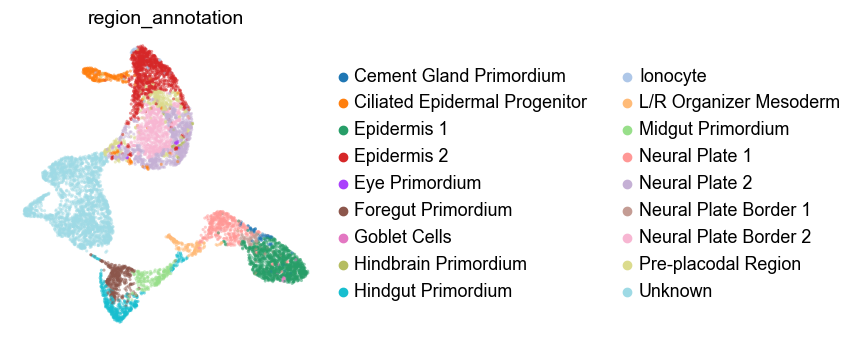

In [97]:
# Now, plot the UMAP
sc.pl.umap(adata, color='region_annotation', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_19_umap_region_annotation.png")

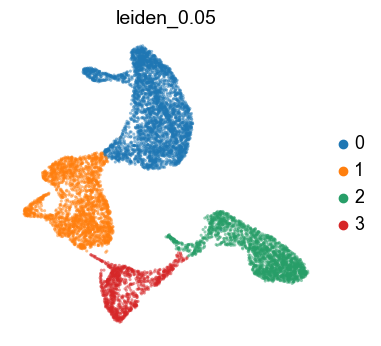

In [98]:
sc.pl.umap(adata, color='leiden_0.05', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_20_umap_leiden_0_05.png")

In [99]:
# Subset the AnnData object to include only cells with the "0" annotation in the leiden_0.1 column
adata_4 = adata[adata.obs['leiden_0.05'] == '1'].copy()

# adata_4 now contains only the cells with a "0" annotation in the leiden_0.1 column

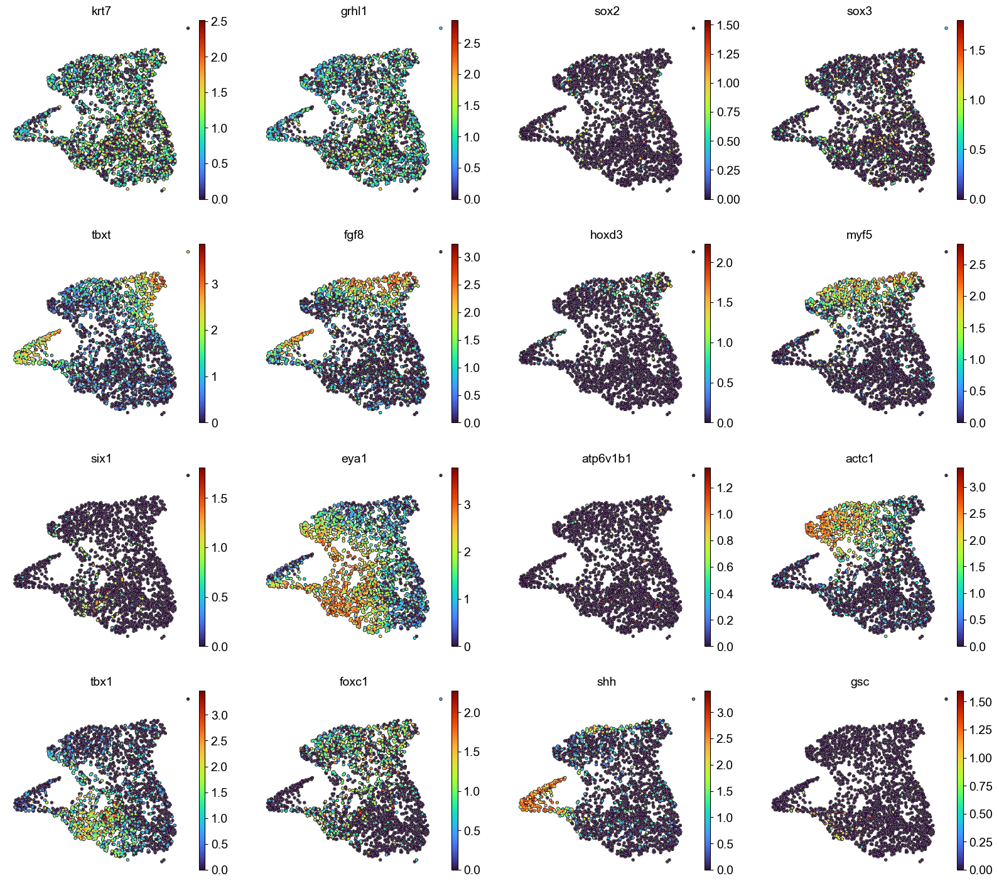

In [100]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'hoxd3', 'myf5', 'six1', 'eya1', 'atp6v1b1', 'actc1', 'tbx1', 'foxc1', 'shh', 'gsc']
sc.pl.umap(adata_4, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=20, frameon=False, legend_fontsize=12, alpha=1, save="_S04_21_umap_marker_panel.png")

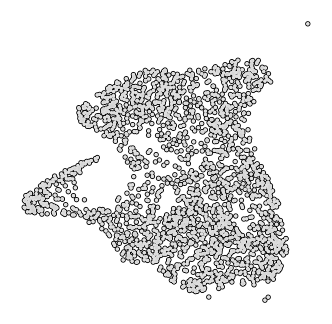

In [101]:
sc.pl.umap(adata_4, frameon=False, size=20, add_outline=True, save="_S04_22_umap.png")

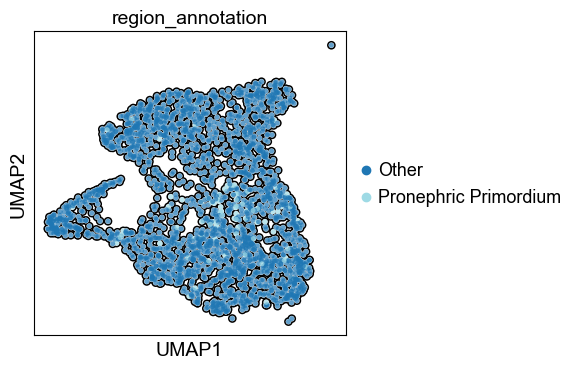

In [102]:
# Define a threshold for "high" expression
threshold = .01  # adjust based on your data (you might use 0.5, 1, or a quantile)

# Logical mask: cells where both rax and pax6 are highly expressed
mask = (adata_4[:, 'pax8'].X > threshold).toarray().flatten()

# Create a new column for annotation if it doesn't exist
adata_4.obs['region_annotation'] = 'Other'

# Assign "Anterior Neural Plate" to cells meeting the condition
adata_4.obs.loc[mask, 'region_annotation'] = 'Pronephric Primordium'
sc.pl.umap(adata_4, color = "region_annotation", add_outline=True, palette="tab20")

Pre-chordal Plate Mesoderm assigned: 36
region_annotation
Other                         2106
Pronephric Primordium           89
Pre-chordal Plate Mesoderm      36
Name: count, dtype: int64


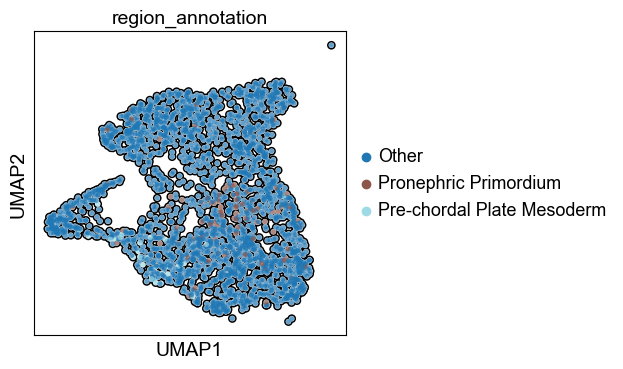

In [103]:
threshold = 0.05
new_label = "Pre-chordal Plate Mesoderm"

# Cells expressing gsc above the threshold
gsc_mask = gene_mask(
    adata_4,
    "gsc",
    threshold
)

# Overwrite any existing annotation for gsc-positive cells
gsc_positive_mask = gsc_mask

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    gsc_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print(
    "Pre-chordal Plate Mesoderm assigned:",
    gsc_positive_mask.sum()
)
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Anterior Paraxial Mesoderm: 421
region_annotation
Other                         1685
Anterior Paraxial Mesoderm     421
Pronephric Primordium           89
Pre-chordal Plate Mesoderm      36
Name: count, dtype: int64


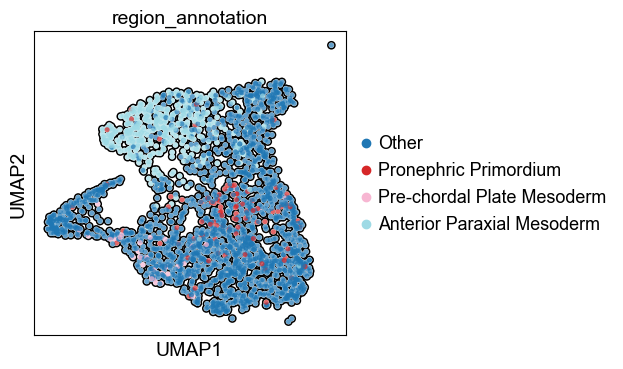

In [104]:
threshold = 1.5
new_label = "Anterior Paraxial Mesoderm"

# Cells expressing actc1 above the threshold
actc1_mask = gene_mask(
    adata_4,
    "actc1",
    threshold
)

# Only overwrite cells currently labeled Other
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

actc1_positive_mask = actc1_mask & other_mask

# Add the new categorical label
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    actc1_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Anterior Paraxial Mesoderm:", actc1_positive_mask.sum())
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Posterior Paraxial Mesoderm: 206
region_annotation
Other                          1567
Anterior Paraxial Mesoderm      333
Posterior Paraxial Mesoderm     206
Pronephric Primordium            89
Pre-chordal Plate Mesoderm       36
Name: count, dtype: int64


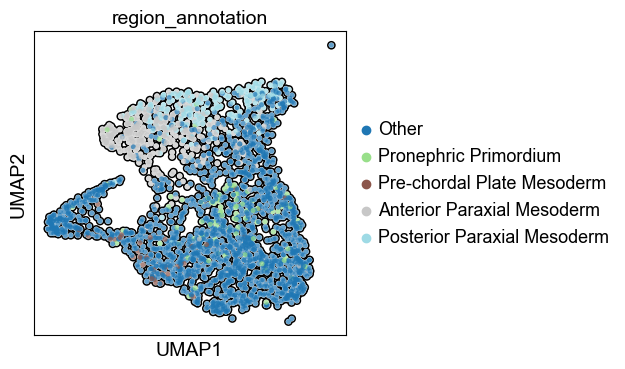

In [105]:
threshold = 1.0
new_label = "Posterior Paraxial Mesoderm"

# Cells expressing fgf8 and myf5 above the threshold
fgf8_mask = gene_mask(
    adata_4,
    "fgf8",
    threshold
)

myf5_mask = gene_mask(
    adata_4,
    "myf5",
    threshold
)

# Allow overwriting only these existing annotations
allowed_annotation_mask = (
    adata_4.obs["region_annotation"]
    .isin(["Other", "Anterior Paraxial Mesoderm"])
    .to_numpy()
)

# Require both fgf8 and myf5 expression
posterior_paraxial_mask = (
    fgf8_mask
    & myf5_mask
    & allowed_annotation_mask
)

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    posterior_paraxial_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print(
    "Posterior Paraxial Mesoderm:",
    posterior_paraxial_mask.sum()
)
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Pharyngeal Mesoderm assigned: 378
region_annotation
Other                          1189
Pharyngeal Mesoderm             378
Anterior Paraxial Mesoderm      333
Posterior Paraxial Mesoderm     206
Pronephric Primordium            89
Pre-chordal Plate Mesoderm       36
Name: count, dtype: int64


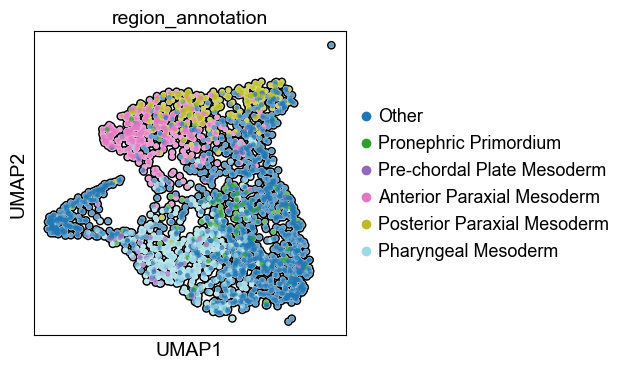

In [106]:
threshold = 1.0
new_label = "Pharyngeal Mesoderm"

# Cells expressing tbx1 above the threshold
tbx1_mask = gene_mask(
    adata_4,
    "tbx1",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

tbx1_positive_mask = tbx1_mask & other_mask

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    tbx1_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Pharyngeal Mesoderm assigned:", tbx1_positive_mask.sum())
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Ventral Blood Island assigned: 99
region_annotation
Other                          1090
Pharyngeal Mesoderm             378
Anterior Paraxial Mesoderm      333
Posterior Paraxial Mesoderm     206
Ventral Blood Island             99
Pronephric Primordium            89
Pre-chordal Plate Mesoderm       36
Name: count, dtype: int64


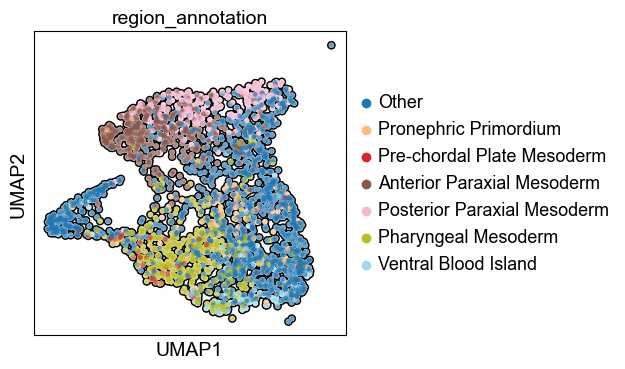

In [107]:
threshold = 1.0
new_label = "Ventral Blood Island"

# Cells expressing runx1 above the threshold
runx1_mask = gene_mask(
    adata_4,
    "runx1",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

runx1_positive_mask = runx1_mask & other_mask

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    runx1_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Ventral Blood Island assigned:", runx1_positive_mask.sum())
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Ventral Mesoderm assigned: 648
region_annotation
Ventral Mesoderm               648
Other                          442
Pharyngeal Mesoderm            378
Anterior Paraxial Mesoderm     333
Posterior Paraxial Mesoderm    206
Ventral Blood Island            99
Pronephric Primordium           89
Pre-chordal Plate Mesoderm      36
Name: count, dtype: int64


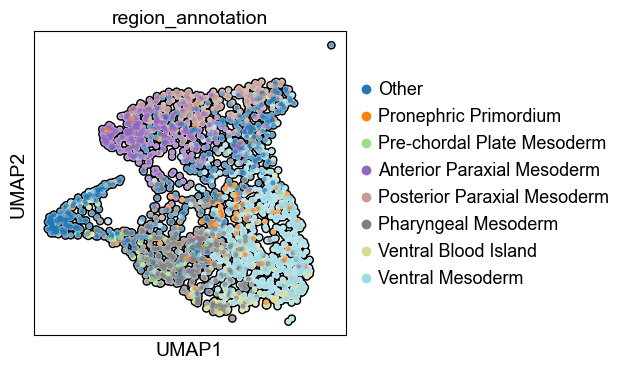

In [108]:
threshold = 1.0
new_label = "Ventral Mesoderm"

# Cells expressing gata6 above the threshold
gata6_mask = gene_mask(
    adata_4,
    "gata6",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

gata6_positive_mask = gata6_mask & other_mask

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    gata6_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Ventral Mesoderm assigned:", gata6_positive_mask.sum())
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Lateral Mesoderm assigned: 126
region_annotation
Ventral Mesoderm               648
Pharyngeal Mesoderm            378
Anterior Paraxial Mesoderm     333
Other                          316
Posterior Paraxial Mesoderm    206
Lateral Mesoderm               126
Ventral Blood Island            99
Pronephric Primordium           89
Pre-chordal Plate Mesoderm      36
Name: count, dtype: int64


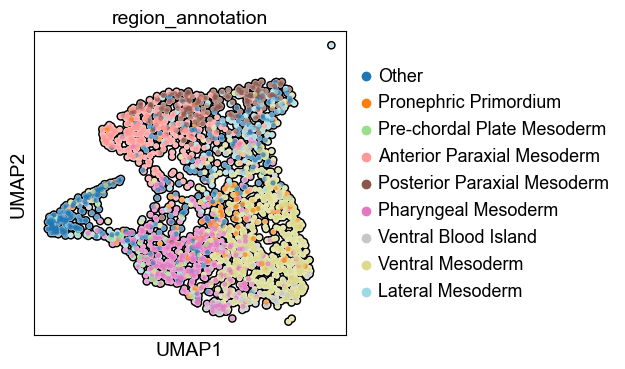

In [109]:
threshold = 0.05
new_label = "Lateral Mesoderm"

# Cells expressing foxc1 above the threshold
foxc1_mask = gene_mask(
    adata_4,
    "foxc1",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

foxc1_positive_mask = foxc1_mask & other_mask

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    foxc1_positive_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print("Lateral Mesoderm assigned:", foxc1_positive_mask.sum())
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Dorsolateral Mesoderm assigned: 147
region_annotation
Ventral Mesoderm               648
Pharyngeal Mesoderm            378
Anterior Paraxial Mesoderm     333
Posterior Paraxial Mesoderm    206
Other                          169
Dorsolateral Mesoderm          147
Lateral Mesoderm               126
Ventral Blood Island            99
Pronephric Primordium           89
Pre-chordal Plate Mesoderm      36
Name: count, dtype: int64


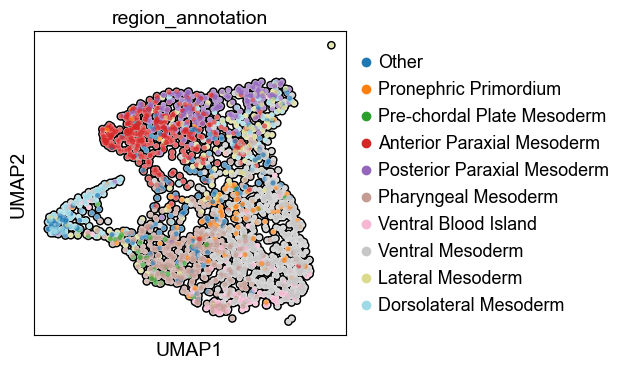

In [110]:
threshold = 0.05
new_label = "Dorsolateral Mesoderm"

# Cells expressing fgf8 above the threshold
fgf8_mask = gene_mask(
    adata_4,
    "fgf8",
    threshold
)

# Cells expressing tbxt above the threshold
tbxt_mask = gene_mask(
    adata_4,
    "tbxt",
    threshold
)

# Only overwrite cells currently labeled "Other"
other_mask = (
    adata_4.obs["region_annotation"]
    .eq("Other")
    .to_numpy()
)

# Require both fgf8 and tbxt expression
dorsolateral_mesoderm_mask = (
    fgf8_mask
    & tbxt_mask
    & other_mask
)

# Add the new categorical label if necessary
if new_label not in adata_4.obs["region_annotation"].cat.categories:
    adata_4.obs["region_annotation"] = (
        adata_4.obs["region_annotation"]
        .cat.add_categories([new_label])
    )

# Assign the annotation
adata_4.obs.loc[
    dorsolateral_mesoderm_mask,
    "region_annotation"
] = new_label

# Check annotation counts
print(
    "Dorsolateral Mesoderm assigned:",
    dorsolateral_mesoderm_mask.sum()
)
print(adata_4.obs["region_annotation"].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color="region_annotation",
    add_outline=True,
    palette="tab20"
)

Notochord assigned: 207
region_annotation
Ventral Mesoderm               632
Pharyngeal Mesoderm            347
Anterior Paraxial Mesoderm     329
Notochord                      207
Posterior Paraxial Mesoderm    203
Other                          122
Lateral Mesoderm               109
Ventral Blood Island            92
Pronephric Primordium           87
Dorsolateral Mesoderm           75
Pre-chordal Plate Mesoderm      28
Name: count, dtype: int64


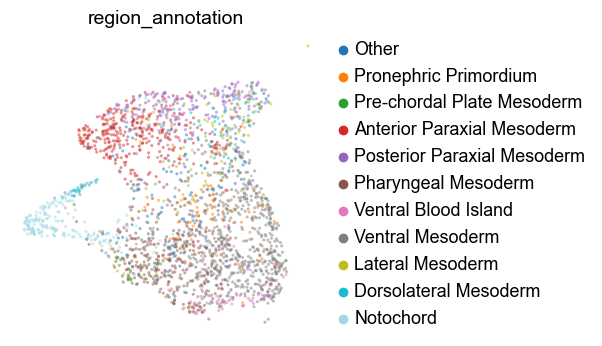

In [111]:
import pandas as pd
import scanpy as sc

threshold = 3.0
annotation_col = "region_annotation"
new_label = "Notochord"

# Cells expressing chrd.1 above the threshold
chrd1_mask = gene_mask(
    adata_4,
    "chrd.1",
    threshold
)

# Ensure the annotation column is categorical
if not isinstance(
    adata_4.obs[annotation_col].dtype,
    pd.CategoricalDtype
):
    adata_4.obs[annotation_col] = pd.Categorical(
        adata_4.obs[annotation_col]
    )

# Add Notochord as an allowed category if necessary
if new_label not in adata_4.obs[annotation_col].cat.categories:
    adata_4.obs[annotation_col] = (
        adata_4.obs[annotation_col]
        .cat.add_categories([new_label])
    )

# Label every chrd.1-positive cell as Notochord,
# regardless of its previous annotation
adata_4.obs.loc[
    chrd1_mask,
    annotation_col
] = new_label

# Check annotation counts
print("Notochord assigned:", chrd1_mask.sum())
print(adata_4.obs[annotation_col].value_counts())

# Plot
sc.pl.umap(
    adata_4,
    color=annotation_col,
    frameon=False,
    size=20,
    add_outline=False,
    alpha=0.5,
    palette="tab20"
)

__Performing an additional Knn calculation on annotation labels to eliminate the "Other" annotation__

Iteration 1: assigned 122 cells; 0 remain Other.
Iteration 2: no additional Other cells could be assigned.

Final annotation counts:
region_annotation
Ventral Mesoderm               658
Pharyngeal Mesoderm            379
Anterior Paraxial Mesoderm     359
Notochord                      211
Posterior Paraxial Mesoderm    208
Lateral Mesoderm               124
Pronephric Primordium           93
Ventral Blood Island            92
Dorsolateral Mesoderm           77
Pre-chordal Plate Mesoderm      30
Name: count, dtype: int64


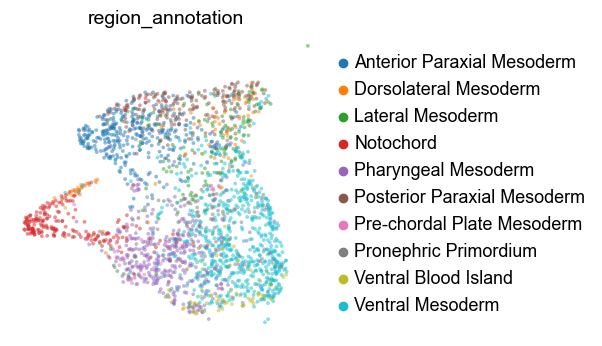

In [112]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neighbors import NearestNeighbors

annotation_col = "region_annotation"
unassigned_label = "Other"

# Number of nearby cells in the existing UMAP to examine
n_neighbors = 5

# Number of iterative labeling rounds
maximum_iterations = 10

# Required fraction of the weighted vote
minimum_confidence = 0.25

# Preserve the existing UMAP coordinates
original_umap = adata_4.obsm["X_umap"].copy()

# Save labels before this procedure
adata_4.obs["region_annotation_before_umap_knn"] = (
    adata_4.obs[annotation_col].astype(str)
)

labels = adata_4.obs[annotation_col].astype(str).copy()

# Build KNN using the existing UMAP coordinates
knn = NearestNeighbors(
    n_neighbors=n_neighbors + 1,
    metric="euclidean"
)

knn.fit(original_umap)

distances, neighbor_indices = knn.kneighbors(original_umap)

# Remove each cell itself from its neighbor list
distances = distances[:, 1:]
neighbor_indices = neighbor_indices[:, 1:]

for iteration in range(maximum_iterations):

    current_labels = labels.copy()

    other_positions = np.flatnonzero(
        current_labels.eq(unassigned_label).to_numpy()
    )

    assignments = {}

    for cell_pos in other_positions:

        cell_neighbor_positions = neighbor_indices[cell_pos]
        cell_neighbor_distances = distances[cell_pos]

        neighbor_labels = (
            current_labels
            .iloc[cell_neighbor_positions]
            .to_numpy()
        )

        # Ignore neighbors that are also Other
        labeled_mask = neighbor_labels != unassigned_label

        neighbor_labels = neighbor_labels[labeled_mask]
        neighbor_distances = cell_neighbor_distances[labeled_mask]

        if len(neighbor_labels) == 0:
            continue

        # Nearby cells receive greater voting weight
        neighbor_weights = 1 / (neighbor_distances + 1e-8)

        weighted_votes = (
            pd.DataFrame({
                "label": neighbor_labels,
                "weight": neighbor_weights
            })
            .groupby("label")["weight"]
            .sum()
            .sort_values(ascending=False)
        )

        best_label = weighted_votes.index[0]

        confidence = (
            weighted_votes.iloc[0]
            / weighted_votes.sum()
        )

        if confidence >= minimum_confidence:
            assignments[cell_pos] = best_label

    if not assignments:
        print(
            f"Iteration {iteration + 1}: "
            "no additional Other cells could be assigned."
        )
        break

    for cell_pos, assigned_label in assignments.items():
        labels.iloc[cell_pos] = assigned_label

    print(
        f"Iteration {iteration + 1}: "
        f"assigned {len(assignments)} cells; "
        f"{labels.eq(unassigned_label).sum()} remain Other."
    )

# Store the updated annotations
adata_4.obs[annotation_col] = pd.Categorical(labels)

# Explicitly preserve the original embedding
adata_4.obsm["X_umap"] = original_umap

print("\nFinal annotation counts:")
print(adata_4.obs[annotation_col].value_counts())

# Plot using the unchanged UMAP coordinates
sc.pl.umap(
    adata_4,
    color=annotation_col,
    frameon=False,
    size=30,
    add_outline=False,
    alpha=0.5,
    save="_S04_23_umap_annotation_col.png"
)

__Recombine our annotated subsetted data with our original adata UMAP under the column "region_annotation"__

In [113]:
# Extract unique categories from adata_4
new_categories_4 = adata_4.obs["region_annotation"].unique()

# Get the current categories in adata
current_categories_R = (
    adata.obs["region_annotation"].cat.categories
)

# Identify categories present in adata_4 but missing from adata
categories_to_add = [
    category
    for category in new_categories_4
    if category not in current_categories_R
]

# Add missing categories to adata
if categories_to_add:
    adata.obs["region_annotation"] = (
        adata.obs["region_annotation"]
        .cat.add_categories(categories_to_add)
    )

# Update region_annotation in adata using matching cells from adata_4
for cell_id in adata_4.obs_names:

    if cell_id in adata.obs_names:
        adata.obs.at[
            cell_id,
            "region_annotation"
        ] = adata_4.obs.at[
            cell_id,
            "region_annotation"
        ]

print(adata.obs["region_annotation"].value_counts())

region_annotation
Epidermis 1                      1146
Epidermis 2                      1123
Neural Plate 2                    879
Neural Plate Border 2             698
Ventral Mesoderm                  658
Neural Plate 1                    463
Hindgut Primordium                390
Pharyngeal Mesoderm               379
Foregut Primordium                377
Pre-placodal Region               372
Anterior Paraxial Mesoderm        359
Ciliated Epidermal Progenitor     298
Midgut Primordium                 213
Notochord                         211
Posterior Paraxial Mesoderm       208
L/R Organizer Mesoderm            163
Lateral Mesoderm                  124
Pronephric Primordium              93
Ventral Blood Island               92
Dorsolateral Mesoderm              77
Cement Gland Primordium            67
Neural Plate Border 1              66
Hindbrain Primordium               40
Ionocyte                           37
Pre-chordal Plate Mesoderm         30
Eye Primordium                  

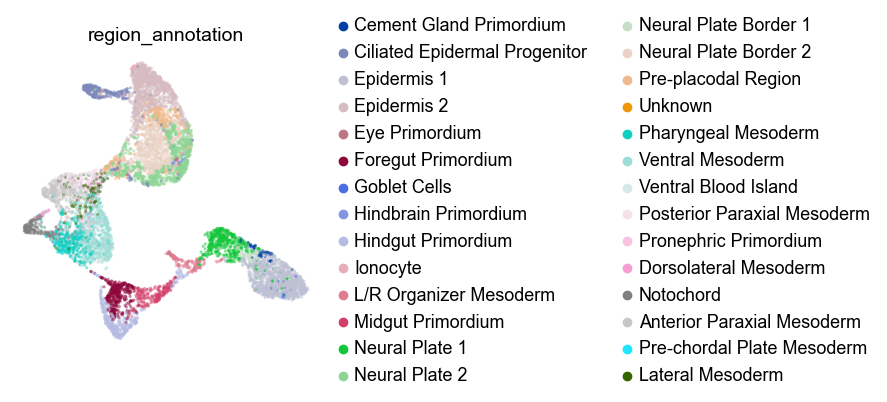

In [114]:
# Now, plot the UMAP
sc.pl.umap(adata, color='region_annotation', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_24_umap_region_annotation.png")

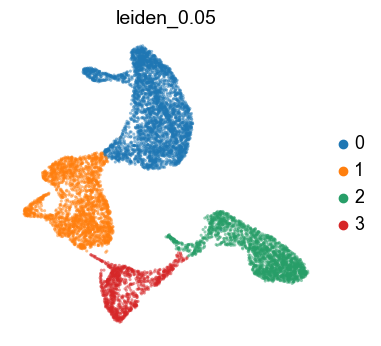

In [115]:
sc.pl.umap(adata, color='leiden_0.05', frameon=False, size=20, add_outline=False, alpha=.5, save="_S04_25_umap_leiden_0_05.png")

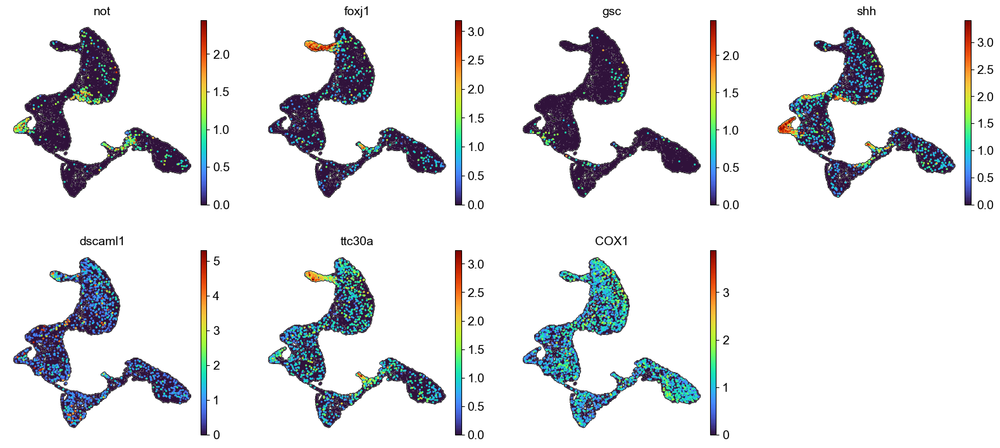

In [116]:
#Markers Expression Check
gene_list=['not', 'foxj1', 'gsc', 'shh', 'dscaml1', 'ttc30a', 'COX1']
sc.pl.umap(adata, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=20, frameon=False, legend_fontsize=12, alpha=1, save="_S04_26_umap_marker_panel.png")

# Section 5: Differential gene-expression analysis

This section uses the Wilcoxon rank-sum test to identify:

1. marker genes for every sufficiently populated final annotation versus the remaining cells; and
2. marker genes for selected two-group comparisons.

Each test saves the complete Scanpy result, an FDR/log-fold-change filtered
table, the top-ranked genes per group, group sizes, test parameters, and
descriptive figures.

In [117]:
from scripts.output_utils import (
    export_rank_genes_groups,
    save_annotation_summary,
    save_current_figure,
    save_dataframe,
    slugify,
)

SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section5"]
SECTION_FIGURES_DIR.mkdir(parents=True, exist_ok=True)
DEG_DIR.mkdir(parents=True, exist_ok=True)
TABLES_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = str(SECTION_FIGURES_DIR)

ANNOTATION_COL = "region_annotation"
MIN_CELLS_PER_GROUP = 7
TOP_GENES_TO_PLOT = 15

print("Current section figure directory:", SECTION_FIGURES_DIR)
print("Differential-expression table directory:", DEG_DIR)
print("Summary table directory:", TABLES_DIR)


Current section figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\figures\Section5-DifferentialExpression
Differential-expression table directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression
Summary table directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables


In [118]:
# Save final annotation abundance before differential-expression testing.
annotation_counts_path = save_annotation_summary(
    adata,
    output_dir=TABLES_DIR,
    filename=f"{DATASET_SLUG}_final_annotation_counts.csv",
    annotation_col=ANNOTATION_COL,
)

group_counts = (
    adata.obs[ANNOTATION_COL]
    .astype(str)
    .value_counts()
    .rename_axis(ANNOTATION_COL)
    .reset_index(name="cell_count")
)

valid_groups = group_counts.loc[
    group_counts["cell_count"] >= MIN_CELLS_PER_GROUP,
    ANNOTATION_COL,
].tolist()

excluded_groups = group_counts.loc[
    group_counts["cell_count"] < MIN_CELLS_PER_GROUP
].copy()

save_dataframe(
    excluded_groups,
    TABLES_DIR,
    f"{DATASET_SLUG}_deg_groups_excluded_below_{MIN_CELLS_PER_GROUP}_cells.csv",
)

adata_deg = adata[
    adata.obs[ANNOTATION_COL].astype(str).isin(valid_groups)
].copy()

if isinstance(adata_deg.obs[ANNOTATION_COL].dtype, pd.CategoricalDtype):
    adata_deg.obs[ANNOTATION_COL] = (
        adata_deg.obs[ANNOTATION_COL].cat.remove_unused_categories()
    )

all_groups_key = "all_annotations_vs_rest_wilcoxon"

sc.tl.rank_genes_groups(
    adata_deg,
    groupby=ANNOTATION_COL,
    groups=valid_groups,
    reference="rest",
    method="wilcoxon",
    pts=True,
    key_added=all_groups_key,
)

export_rank_genes_groups(
    adata_deg,
    key=all_groups_key,
    output_dir=DEG_DIR,
    prefix=f"{DATASET_SLUG}_all_annotations_vs_rest_wilcoxon",
    groupby=ANNOTATION_COL,
    fdr_max=0.05,
    abs_log2fc_min=1.0,
    top_n=25,
)

sc.pl.rank_genes_groups(
    adata_deg,
    groups=valid_groups,
    n_genes=25,
    sharey=False,
    key=all_groups_key,
    show=False,
)
save_current_figure(
    SECTION_FIGURES_DIR,
    f"S05_01_{DATASET_SLUG}_all_annotations_vs_rest_ranked_genes.png",
)

Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_final_annotation_counts.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_deg_groups_excluded_below_7_cells.csv
ranking genes


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:401: PerformanceWarning: DataFrame is highly fragmented.  This is usuall

    finished (0:00:56)
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_all_annotations_vs_rest_wilcoxon_all_results.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_all_annotations_vs_rest_wilcoxon_significant_fdr0p05_abslog2fc1p0.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_all_annotations_vs_rest_wilcoxon_top25_per_group.csv
Saved DEG parameters: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_all_annotations_vs_rest_wilcoxon_parameters.json
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_all_annotations_vs_rest_wil

WindowsPath('C:/Users/coron/OneDrive/Desktop/snRNAseq/gastrula_snrnaseq_github_bundle/results/Stage12_0/MO/figures/Section5-DifferentialExpression/S05_01_Stage12_0-MO_all_annotations_vs_rest_ranked_genes.png')

In [119]:
# Selected pairwise comparisons from the annotation workflow.
PAIRWISE_COMPARISONS = [('Epidermis 1', 'Epidermis 2', 'epidermis_1_vs_2'), ('Neural Plate 1', 'Neural Plate 2', 'neural_plate_1_vs_2'), ('Neural Plate Border 1', 'Neural Plate Border 2', 'neural_plate_border_1_vs_2')]

comparison_inventory = []

for comparison_index, (group_1, group_2, comparison_slug) in enumerate(
    PAIRWISE_COMPARISONS,
    start=1,
):
    present_labels = set(adata.obs[ANNOTATION_COL].astype(str))

    if group_1 not in present_labels or group_2 not in present_labels:
        comparison_inventory.append(
            {
                "comparison": comparison_slug,
                "group_1": group_1,
                "group_2": group_2,
                "status": "skipped_missing_group",
                "group_1_cells": int(
                    (adata.obs[ANNOTATION_COL].astype(str) == group_1).sum()
                ),
                "group_2_cells": int(
                    (adata.obs[ANNOTATION_COL].astype(str) == group_2).sum()
                ),
            }
        )
        print(
            f"Skipping {comparison_slug}: one or both groups are absent."
        )
        continue

    pair = adata[
        adata.obs[ANNOTATION_COL].astype(str).isin([group_1, group_2])
    ].copy()

    if isinstance(pair.obs[ANNOTATION_COL].dtype, pd.CategoricalDtype):
        pair.obs[ANNOTATION_COL] = (
            pair.obs[ANNOTATION_COL].cat.remove_unused_categories()
        )

    pair_counts = pair.obs[ANNOTATION_COL].astype(str).value_counts()

    if (pair_counts < 2).any():
        comparison_inventory.append(
            {
                "comparison": comparison_slug,
                "group_1": group_1,
                "group_2": group_2,
                "status": "skipped_group_below_2_cells",
                "group_1_cells": int(pair_counts.get(group_1, 0)),
                "group_2_cells": int(pair_counts.get(group_2, 0)),
            }
        )
        continue

    deg_key = f"{comparison_slug}_wilcoxon"

    # With only two groups in the subset, each group versus rest is the
    # reciprocal pairwise comparison.
    sc.tl.rank_genes_groups(
        pair,
        groupby=ANNOTATION_COL,
        groups=[group_1, group_2],
        reference="rest",
        method="wilcoxon",
        pts=True,
        key_added=deg_key,
    )

    export_rank_genes_groups(
        pair,
        key=deg_key,
        output_dir=DEG_DIR,
        prefix=f"{DATASET_SLUG}_{comparison_slug}_wilcoxon",
        groupby=ANNOTATION_COL,
        fdr_max=0.05,
        abs_log2fc_min=1.0,
        top_n=25,
    )

    figure_number = comparison_index + 1

    sc.pl.umap(
        pair,
        color=ANNOTATION_COL,
        frameon=False,
        size=20,
        add_outline=False,
        alpha=0.5,
        show=False,
    )
    save_current_figure(
        SECTION_FIGURES_DIR,
        f"S05_{figure_number:02d}_{DATASET_SLUG}_"
        f"{comparison_slug}_umap.png",
    )

    sc.pl.rank_genes_groups(
        pair,
        groups=[group_1, group_2],
        n_genes=25,
        sharey=False,
        key=deg_key,
        show=False,
    )
    save_current_figure(
        SECTION_FIGURES_DIR,
        f"S05_{figure_number:02d}_{DATASET_SLUG}_"
        f"{comparison_slug}_ranked_genes.png",
    )

    sc.pl.rank_genes_groups_heatmap(
        pair,
        groups=[group_1, group_2],
        n_genes=TOP_GENES_TO_PLOT,
        key=deg_key,
        groupby=ANNOTATION_COL,
        show_gene_labels=True,
        dendrogram=False,
        show=False,
    )
    save_current_figure(
        SECTION_FIGURES_DIR,
        f"S05_{figure_number:02d}_{DATASET_SLUG}_"
        f"{comparison_slug}_heatmap.png",
    )

    sc.pl.rank_genes_groups_dotplot(
        pair,
        groups=[group_1, group_2],
        n_genes=TOP_GENES_TO_PLOT,
        key=deg_key,
        groupby=ANNOTATION_COL,
        dendrogram=False,
        show=False,
    )
    save_current_figure(
        SECTION_FIGURES_DIR,
        f"S05_{figure_number:02d}_{DATASET_SLUG}_"
        f"{comparison_slug}_dotplot.png",
    )

    sc.pl.rank_genes_groups_matrixplot(
        pair,
        groups=[group_1, group_2],
        n_genes=TOP_GENES_TO_PLOT,
        key=deg_key,
        groupby=ANNOTATION_COL,
        dendrogram=False,
        show=False,
    )
    save_current_figure(
        SECTION_FIGURES_DIR,
        f"S05_{figure_number:02d}_{DATASET_SLUG}_"
        f"{comparison_slug}_matrixplot.png",
    )

    comparison_inventory.append(
        {
            "comparison": comparison_slug,
            "group_1": group_1,
            "group_2": group_2,
            "status": "completed",
            "group_1_cells": int(pair_counts.get(group_1, 0)),
            "group_2_cells": int(pair_counts.get(group_2, 0)),
        }
    )

comparison_inventory = pd.DataFrame(comparison_inventory)

save_dataframe(
    comparison_inventory,
    TABLES_DIR,
    f"{DATASET_SLUG}_section5_comparison_inventory.csv",
)

comparison_inventory

ranking genes
    finished (0:00:04)
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_epidermis_1_vs_2_wilcoxon_all_results.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_epidermis_1_vs_2_wilcoxon_significant_fdr0p05_abslog2fc1p0.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_epidermis_1_vs_2_wilcoxon_top25_per_group.csv
Saved DEG parameters: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_epidermis_1_vs_2_wilcoxon_parameters.json
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\differential_expression\stage12_0-mo_epidermis_1_vs_2_wilcoxon_group_counts.cs

                   comparison                group_1                group_2  \
0            epidermis_1_vs_2            Epidermis 1            Epidermis 2   
1         neural_plate_1_vs_2         Neural Plate 1         Neural Plate 2   
2  neural_plate_border_1_vs_2  Neural Plate Border 1  Neural Plate Border 2   

      status  group_1_cells  group_2_cells  
0  completed           1146           1123  
1  completed            463            879  
2  completed             66            698  

** **

# __Section 6: Final cell-type annotation rationale considering differential expression and literature precedence__

 __Topics__
- Discussion for utilizing DEG alongside contemporary literature to further annotate germ layer cell-types

  __DEG of interest__
- Basal/Lamina markers like: col18a1, fn1, pdgfra are more highly expressed in Endoderm2, Neuroectoderm2, Epidermis2, Mesoderm2 than (1).
- Epithelial markers like: epas1, nectin2, epcam in Neuroectoderm1, Mesoderm1 as well as grainyheads/keratins in the Epidermis1 and slc5a8.1, plekhg5 in the Endoderm1 are highly expressed compared to (2).
- Taken together (1) cells are likely the 'Outer' epithelial layer while (2) cells are their 'Inner' basal layer counterparts.


  __Literature Precedence__
- Briggs et al., 2018 (https://www.science.org/doi/10.1126/science.aar5780) landmark paper demonstrated Xenopus tropicalis development through gastrulation. At stage 10 they have identified a single neuroectodermal and a single epidermal cluster.
- Lee et al., 2023 (https://www.science.org/doi/10.1126/sciadv.add5745) mucociliary epithelial development paper demonstrated Xenopus tropicalis ectoderm dissected cells through gastrulation. At stage 10 they identify a single cluster of ectoderm cells.
- Numerous studies by Chalmers concerning early Xenopus tropicalis ectoderm development demonstrate that apical-basal polarity of ectodermal cells forming inner and outer layer cells is established as early as the 64-cell stage and later demarked by differential expression of keratin and grainyhead in the early gastrula (Chalmers et al., 2002 - https://doi.org/10.1016/S1534-5807(02)00113-2, Chalmers et al., 2003 - https://doi.org/10.1242/dev.00490, Chalmers et al., 2005 - https://doi.org/10.1242/dev.01645, Chalmers et al., 2006 - https://doi.org/10.1016/j.mod.2006.04.006).

  __Conclusion__
- Previous single cell sequencing experiments of Xenopus tropicalis early gastrula have not yielded sufficient resolution to identify inner and outer epidermal and neuroectodermal cell states, however there is a compilation of evidence supporting the establishment and differential expression across the inner and outer layer ectoderm.
- Our data specifically confirms Chalmers et al., 2006 in identifying heterogenous "Inner" and "Outer" layer ectoderm cell states while also furthering our understanding of the complete repetoire of genes differentially expressed within these emergent cell states of Xenopus tropicalis early gastrula.


** **
 

In [120]:
# Route all Scanpy and Matplotlib figures in Section 6 here.
SECTION_FIGURES_DIR = SECTION_FIGURE_DIRS["Section6"]
SECTION_FIGURES_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = str(SECTION_FIGURES_DIR)

print("Current section figure directory:", SECTION_FIGURES_DIR)


Current section figure directory: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\figures\Section6-FinalAnnotation


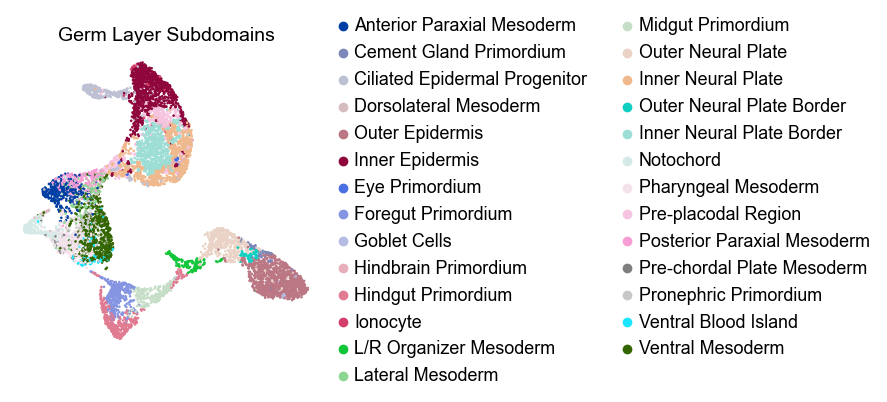

In [121]:
import pandas as pd
import scanpy as sc

# Create a renamed annotation column while preserving the original category column
adata.obs["region_annotation"] = adata.obs["region_annotation"].copy()

# Rename category labels
rename_dict = {
    "Anterior Paraxial Mesoderm": "Anterior Paraxial Mesoderm",
    "Cement Gland Primordium": "Cement Gland Primordium",
    "Ciliated Epidermal Progenitor":"Ciliated Epidermal Progenitor",
    "Dorsolateral Mesoderm": "Dorsolateral Mesoderm",

    "Epidermis 1": "Outer Epidermis",
    "Epidermis 2": "Inner Epidermis",
    
    "Eye Primordium": "Eye Primordium",

    "Foregut Primordium": "Foregut Primordium",
    "Goblet Cells": "Goblet Cells",

    "Hindbrain Primordium": "Hindbrain Primordium",
    "Hindgut Primordium": "Hindgut Primordium",
    "Ionocyte": "Ionocyte",
    "L/R Organizer Mesoderm" : "L/R Organizer Mesoderm",
    "Lateral Mesoderm":"Lateral Mesoderm",
    "Midgut Primordium": "Midgut Primordium",

    "Neural Plate 1": "Outer Neural Plate",
    "Neural Plate 2": "Inner Neural Plate",

    "Neural Plate Border 1": "Outer Neural Plate Border",
    "Neural Plate Border 2": "Inner Neural Plate Border",

    "Notochord": "Notochord",
    "Pharyngeal Mesoderm":"Pharyngeal Mesoderm",
    "Posterior Paraxial Mesoderm":"Posterior Paraxial Mesoderm",
    "Pre-chordal Plate Mesoderm":"Pre-chordal Plate Mesoderm",
    "Pronephric Primordium":"Pronephric Primordium",
    "Ventral Blood Island":"Ventral Blood Island",
    "Ventral Mesoderm":"Ventral Mesoderm",
    "Pre-placodal Region":"Pre-placodal Region"
    

}

adata.obs["region_annotation"] = (
    adata.obs["region_annotation"]
    .replace(rename_dict)
)

groups_to_plot = [
 "Anterior Paraxial Mesoderm",
    "Cement Gland Primordium",
    "Ciliated Epidermal Progenitor",
    "Dorsolateral Mesoderm",

    "Outer Epidermis",
    "Inner Epidermis",
    
    "Eye Primordium",

    "Foregut Primordium",
    "Goblet Cells",

    "Hindbrain Primordium",
    "Hindgut Primordium",
    "Ionocyte",
    "L/R Organizer Mesoderm",
    "Lateral Mesoderm",
    "Midgut Primordium",

    "Outer Neural Plate",
    "Inner Neural Plate",

    "Outer Neural Plate Border",
    "Inner Neural Plate Border",

    "Notochord",
    "Pharyngeal Mesoderm",
    "Pre-placodal Region",
    "Posterior Paraxial Mesoderm",
    "Pre-chordal Plate Mesoderm",
    "Pronephric Primordium",
    "Ventral Blood Island",
    "Ventral Mesoderm",
]

adata_germ_layers = adata[
    adata.obs["region_annotation"].isin(groups_to_plot)
].copy()

adata_germ_layers.obs["region_annotation"] = pd.Categorical(
    adata_germ_layers.obs["region_annotation"],
    categories=groups_to_plot,
    ordered=True
)

sc.pl.umap(
    adata_germ_layers,
    color="region_annotation",
    legend_loc="right margin",
    frameon=False,
    title="Germ Layer Subdomains"
, save="_S06_01_umap_region_annotation.png")

__Save final processed data outputs__


In [122]:
from scripts.output_utils import (
    save_annotation_summary,
    save_cluster_annotation_crosstab,
    save_label_transition_table,
)

# Final cell-type abundance table.
save_annotation_summary(
    adata,
    output_dir=TABLES_DIR,
    filename=f"{DATASET_SLUG}_final_annotation_counts.csv",
    annotation_col="region_annotation",
)

# Save count and row-percentage cross-tabs for each Leiden result retained
# in the final AnnData object.
leiden_columns = [
    column for column in adata.obs.columns
    if str(column).startswith("leiden")
]

for leiden_column in leiden_columns:
    save_cluster_annotation_crosstab(
        adata,
        cluster_col=leiden_column,
        annotation_col="region_annotation",
        output_dir=TABLES_DIR,
        filename=(
            f"{DATASET_SLUG}_{leiden_column}_by_region_annotation_counts.csv"
        ),
    )
    save_cluster_annotation_crosstab(
        adata,
        cluster_col=leiden_column,
        annotation_col="region_annotation",
        output_dir=TABLES_DIR,
        filename=(
            f"{DATASET_SLUG}_{leiden_column}_by_region_annotation_row_percent.csv"
        ),
        normalize=True,
    )

# Save before/after label transition tables when refinement backups exist.
label_backup_columns = [
    column for column in adata.obs.columns
    if str(column).startswith("region_annotation_before")
]

for before_column in label_backup_columns:
    save_label_transition_table(
        adata,
        before_col=before_column,
        after_col="region_annotation",
        output_dir=TABLES_DIR,
        filename=(
            f"{DATASET_SLUG}_{before_column}_to_region_annotation.csv"
        ),
    )

Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_final_annotation_counts.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_leiden_0.2_by_region_annotation_counts.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_leiden_0.2_by_region_annotation_row_percent.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_leiden_1.0_by_region_annotation_counts.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_leiden_1.0_by_region_annotation_row_percent.csv
Saved table: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\tables\Stage12_0-MO_leiden_0.05_by_region_annota

In [123]:
# Save the final annotated AnnData object and complete cell metadata.
OUTPUT_H5AD = (
    PROCESSED_DATA_DIR
    / f"{DATASET_SLUG}_processed_annotated.h5ad"
)
OUTPUT_OBS_CSV = (
    PROCESSED_DATA_DIR
    / f"{DATASET_SLUG}_processed_annotated_cell_metadata.csv"
)

adata.write_h5ad(OUTPUT_H5AD)
adata.obs.to_csv(OUTPUT_OBS_CSV)

print("Saved AnnData:", OUTPUT_H5AD)
print("Saved cell metadata:", OUTPUT_OBS_CSV)


Saved AnnData: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\processed_data\Stage12_0-MO_processed_annotated.h5ad
Saved cell metadata: C:\Users\coron\OneDrive\Desktop\snRNAseq\gastrula_snrnaseq_github_bundle\results\Stage12_0\MO\processed_data\Stage12_0-MO_processed_annotated_cell_metadata.csv
